# DEVELOPMENT-INIT

## Instalación Dependencias

In [76]:
!pip install -U ydata-profiling
!pip install gower
!pip install prince
!pip install -U pyclustering
!pip install scikit-posthocs

### LIBRERIAS

In [77]:
'''
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import geopandas as gpd
import folium
import requests  # GraphHopper API
import re
import gower
import scipy.cluster.hierarchy as sch
import prince
import seaborn as sns
import warnings
import scipy.stats as stats
import phik
import random
#warnings.filterwarnings('ignore')
import lightgbm as lgb
import joblib

from ydata_profiling import ProfileReport
from folium import Choropleth
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, pairwise_distances, davies_bouldin_score, calinski_harabasz_score, classification_report, cohen_kappa_score, silhouette_samples, accuracy_score
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, cophenet
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.manifold import TSNE
from scipy.stats import chi2_contingency
from pandas.api.types import CategoricalDtype
from sklearn.model_selection import train_test_split, StratifiedKFold
'''

"\nimport pandas as pd\nimport numpy as np\nimport matplotlib.pyplot as plt\nimport matplotlib.cm as cm\nimport geopandas as gpd\nimport folium\nimport requests  # GraphHopper API\nimport re\nimport gower\nimport scipy.cluster.hierarchy as sch\nimport prince\nimport seaborn as sns\nimport warnings\nimport scipy.stats as stats\nimport phik\nimport random\n#warnings.filterwarnings('ignore')\nimport lightgbm as lgb\nimport joblib\n\nfrom ydata_profiling import ProfileReport\nfrom folium import Choropleth\nfrom sklearn.cluster import AgglomerativeClustering, DBSCAN\nfrom sklearn.preprocessing import StandardScaler\nfrom sklearn.metrics import silhouette_score, pairwise_distances, davies_bouldin_score, calinski_harabasz_score, classification_report, cohen_kappa_score, silhouette_samples, accuracy_score\nfrom sklearn.metrics.pairwise import cosine_similarity\nfrom scipy.spatial.distance import squareform\nfrom scipy.cluster.hierarchy import dendrogram, linkage, fcluster, cophenet\nfrom pyclu

In [78]:
import folium
import geopandas as gpd
import gower
import joblib
import lightgbm as lgb
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import phik
import prince
import random
import re
import requests
import scipy.cluster.hierarchy as sch
import scipy.stats as stats
import seaborn as sns
import warnings
import scikit_posthocs as sp
import time
import traceback

from folium import Choropleth
from pandas.api.types import CategoricalDtype
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, cophenet
from scipy.spatial.distance import squareform
from scipy.stats import chi2_contingency
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import (silhouette_score, pairwise_distances, davies_bouldin_score, 
                              calinski_harabasz_score, classification_report, cohen_kappa_score, 
                              silhouette_samples, accuracy_score, normalized_mutual_info_score)
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from ydata_profiling import ProfileReport

## MAPEO

In [79]:
#Ajustar columnas de data cruda a un formato estandar Q#_IDData, con el objetivo de optmizar el desarrollo
COLUMNS_MAP_ES = {
    # academico
    'Actualmente estoy estudiando la carrera de:': 'Q1_Carrera',
    'Mi nivel o ciclo académico es:': 'Q2_Ciclo',
    # info-demográfica
    '¿Qué parentesco o relación tiene usted con la/el representante de su hogar?': 'Q3_Parentesco',
    'De acuerdo a su género ¿Cómo se identifica?:': 'Q4_Genero',
    '¿Cuántos años cumplidos tiene usted?': 'Q5_Edad',
    'Indique el tipo de documento de identidad que posee': 'Q6_DocIdentidad',
    '¿Cómo se identifica usted según su cultura y costumbres?': 'Q7_Autoidentificacion',
    '¿En qué idiomas o lenguas habla o se comunica usted?': 'Q8_Idiomas',
    '1.1 ¿Cuál es el idioma o lengua indígena que habla usted?': 'Q9_LenguaIndigena',
    '¿De qué tipo de institución educativa proviene su educación secundaria o colégio?': 'Q10_TipoColegio',
    '¿Cuál es su nivel de instrucción más alto completado?': 'Q11_NivelInstruccion',
    '¿Cual es su estado conyugal actual?:': 'Q12_EstadoCivil',
    '¿Cuántas hijas e hijos nacidos vivos tiene actualmente en total?': 'Q13_NumHijos',
    # discapacidad
    '¿Tiene usted dificultad permanente para: Caminar, subir o bajar escaleras?': 'Q14_DifCaminar',
    '¿Tiene usted dificultad permanente para: Bañarse, vestirse, alimentarse por sí mismo?': 'Q15_DifBanarVestir',
    '¿Tiene usted dificultad permanente para: Hablar, comunicarse o conversar?': 'Q16_DifHablar',
    '¿Tiene usted dificultad permanente para: Oír, incluso usando aparato auditivo?': 'Q17_DifOir',
    '¿Tiene usted dificultad permanente para: Ver, incluso usando lentes?': 'Q18_DifVer',
    '¿Tiene usted dificultad permanente para: Recordar, entender o concentrarse?': 'Q19_DifRecordar',
    # ubicación
    'Indique por favor su provincia de residencia': 'Q20_ProvinciaActual',
    'Indique por favor la parroquia en la que reside actualmente': 'Q45_Parroquia',
    # laboral
    'La semana pasada, usted:': 'Q46_SemanaPasada',
    'En su trabajo principal, ¿cuál es la ocupación o tarea que realiza?': 'Q47_Ocupacion',
    '¿A qué se dedica o qué produce principalmente el negocio, empresa o lugar donde trabaja?': 'Q48_Industria',
    'En el trabajo o negocio que indica, usted es:': 'Q49_CategoriaOcupacional',
    'Si no trabajó: indique el motivo principal': 'Q50_MotivoNoTrabajo',
    'Indique por favor la provincia donde vivía hace 5 años:': 'Q51_Provincia5Anios',
    # vivienda
    'Indique por favor, la ubicación geográfica de la vivienda donde reside actualmente': 'Q76_Zona',
    '¿Dispone la vivienda donde reside de luz (energía eléctrica) proveniente de la red pública?': 'Q77_LuzRedPublica',
    '¿Dispone la vivienda de otra fuente de energía eléctrica distinta a la red pública?': 'Q78_EnergiaAlterna',
    '¿Cuál es su tipo de vivienda?': 'Q79_TipoVivienda',
    '¿El material predominante de las paredes exteriores de la vivienda es de:': 'Q80_MaterialParedes',
    '¿El material predominante del techo o cubierta de la vivienda es de:': 'Q81_MaterialTecho',
    '¿La vivienda que ocupa actualmente usted es:': 'Q82_TenenciaVivienda',
    # tic's
    '¿Su hogar dispone de: 1) Servicio de teléfono convencional?': 'Q83_TelConvencional',
    '¿Su hogar dispone de: 2) Servicio de teléfono celular?': 'Q84_Celular',
    'En los últimos 3 meses, ¿ha utilizado: Teléfono celular?': 'Q85_UsoCelular',
    '¿Su hogar dispone de: 3) Servicio de datos móviles?': 'Q86_DatosMoviles',
    'En los últimos 3 meses, ¿ha utilizado: Datos móviles?': 'Q87_UsoDatos',
    '¿Para qué destina principalmente su uso de datos móviles?': 'Q88_DestinoDatos',
    '¿Su hogar dispone de: 4) Servicio de internet fijo?': 'Q89_InternetFijo',
    'En los últimos 3 meses, ¿ha utilizado: Servicio de Internet Fijo?': 'Q90_UsoInternetFijo',
    '¿Su hogar dispone de: 5) Computadora (de escritorio o laptop)?': 'Q91_Computadora',
    'En los últimos 3 meses, ¿ha utilizado: Computadora o laptop?': 'Q92_UsoComputadora',
    '¿Su hogar dispone de: 6) Tablet?': 'Q93_Tablet',
    'En los últimos 3 meses, ¿ha utilizado: Tablet?': 'Q94_UsoTablet',
    '¿Su hogar dispone de: 7) Automóvil o camioneta para uso exclusivo del hogar?': 'Q95_Auto',
    '¿Su hogar dispone de: 8) Motocicleta para uso exclusivo del hogar?': 'Q96_Moto',
    '¿Cuál es el dispositivo que más usa para sus estudios en línea?': 'Q97_DispositivoEstudio'
}

FINAL_COLUMNS_ORDER = [
    'Q1_Carrera', 'Q2_Ciclo', 'Q3_Parentesco', 'Q4_Genero', 'Q5_Edad', 'Q6_DocIdentidad',
    'Q7_Autoidentificacion', 'Q8_Idiomas', 'Q9_LenguaIndigena', 'Q10_TipoColegio',
    'Q11_NivelInstruccion', 'Q12_EstadoCivil', 'Q13_NumHijos', 'Q14_DifCaminar',
    'Q15_DifBanarVestir', 'Q16_DifHablar', 'Q17_DifOir', 'Q18_DifVer', 'Q19_DifRecordar',
    'Q20_ProvinciaActual', 'Q21_CantonActual', 'Q45_Parroquia', 'Q46_SemanaPasada',
    'Q47_Ocupacion', 'Q48_Industria', 'Q49_CategoriaOcupacional', 'Q50_MotivoNoTrabajo',
    'Q51_Provincia5Anios', 'Q52_Canton5Anios', 'Q76_Zona', 'Q77_LuzRedPublica',
    'Q78_EnergiaAlterna', 'Q79_TipoVivienda', 'Q80_MaterialParedes', 'Q81_MaterialTecho',
    'Q82_TenenciaVivienda', 'Q83_TelConvencional', 'Q84_Celular', 'Q85_UsoCelular',
    'Q86_DatosMoviles', 'Q87_UsoDatos', 'Q88_DestinoDatos', 'Q89_InternetFijo',
    'Q90_UsoInternetFijo', 'Q91_Computadora', 'Q92_UsoComputadora', 'Q93_Tablet',
    'Q94_UsoTablet', 'Q95_Auto', 'Q96_Moto', 'Q97_DispositivoEstudio'
]

try:
    df_original = pd.read_excel("/kaggle/input/data-ups-cruda/DATA_UPS_CRUDA.xlsx")
    print("iniciando transformación...")

except Exception as e:
    print(f"Error {e}")
    df_original = pd.DataFrame()

#consolidar data de cantones similar a discapacidad - Importante!
if not df_original.empty:
    Canton_Current_Cols_Detected = [col for col in df_original.columns if col.startswith('Indique por favor su cantón de residencia:')]
    Canton_5Yrs_Cols_Detected = [col for col in df_original.columns if col.startswith('Indique por favor el cantón donde vivía hace 5 años:')]
    df_original['Q21_CantonActual'] = df_original[Canton_Current_Cols_Detected].bfill(axis=1).iloc[:, 0] # .bfill(axis=1) rellena los valores nulos hacia adelante, tomando el único valor real por fila.
    df_original['Q52_Canton5Anios'] = df_original[Canton_5Yrs_Cols_Detected].bfill(axis=1).iloc[:, 0]
    df_working = df_original.drop(columns=Canton_Current_Cols_Detected + Canton_5Yrs_Cols_Detected)
    final_map = COLUMNS_MAP_ES.copy()
    final_map['Q21_CantonActual'] = 'Q21_CantonActual'
    final_map['Q52_Canton5Anios'] = 'Q52_Canton5Anios'
    df_final = df_working.rename(columns=final_map)
    df_final_reordenado = df_final[FINAL_COLUMNS_ORDER]
    OUTPUT_FILENAME = "/kaggle/working/Data_Consolidada_UPS.xlsx"
    df_final_reordenado.to_excel(OUTPUT_FILENAME, index=False)
    print("OK")

iniciando transformación...


/tmp/ipykernel_48/466976132.py:89: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_original['Q52_Canton5Anios'] = df_original[Canton_5Yrs_Cols_Detected].bfill(axis=1).iloc[:, 0]


OK


## EDA

In [80]:
filepath = "/kaggle/working/Data_Consolidada_UPS.xlsx"
try:
    df = pd.read_excel(filepath)
    print(f"Archivo cargado. Dimensiones: {df.shape}")
    print("\nCabecera:")
    display(df.head())
    print("\nDataFrame:")
    #df.info()
except FileNotFoundError:
    print("verificar ruta archivo")

Archivo cargado. Dimensiones: (375, 51)

Cabecera:


,Q1_Carrera,Q2_Ciclo,Q3_Parentesco,Q4_Genero,Q5_Edad,Q6_DocIdentidad,Q7_Autoidentificacion,Q8_Idiomas,Q9_LenguaIndigena,Q10_TipoColegio,Q11_NivelInstruccion,Q12_EstadoCivil,Q13_NumHijos,Q14_DifCaminar,Q15_DifBanarVestir,Q16_DifHablar,Q17_DifOir,Q18_DifVer,Q19_DifRecordar,Q20_ProvinciaActual,Q21_CantonActual,Q45_Parroquia,Q46_SemanaPasada,Q47_Ocupacion,Q48_Industria,Q49_CategoriaOcupacional,Q50_MotivoNoTrabajo,Q51_Provincia5Anios,Q52_Canton5Anios,Q76_Zona,Q77_LuzRedPublica,Q78_EnergiaAlterna,Q79_TipoVivienda,Q80_MaterialParedes,Q81_MaterialTecho,Q82_TenenciaVivienda,Q83_TelConvencional,Q84_Celular,Q85_UsoCelular,Q86_DatosMoviles,Q87_UsoDatos,Q88_DestinoDatos,Q89_InternetFijo,Q90_UsoInternetFijo,Q91_Computadora,Q92_UsoComputadora,Q93_Tablet,Q94_UsoTablet,Q95_Auto,Q96_Moto,Q97_DispositivoEstudio
0,Administración de Empresas;,Primer ciclo;,3. Hija o hijo,1. Masculino,24,1. Cédula de ciudadanía o de identidad ecuator...,6. Mestiza/o,2. Sólo castellano/ español,NaN,01. Fiscal (del Estado),6. Bachillerato,6. Soltera/o,0,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,17. Pichincha,1705. Rumiñahui,Conocoto,7. No trabajó,NaN,NaN,NaN,3. Es estudiante,17. Pichincha,1705. Rumiñahui,2. Área Rural,1. Sí,1. Planta eléctrica (generador de luz),1. Casa/villa,1. Hormigón,"1. Hormigón (losa, cemento)",4. Arrendada/anticresis,2. No,1. Sí,1. Sí,1. Sí,1. Sí,"Comunicación;Estudio (portal académico, clases...",2. No,NaN,2. No,NaN,2. No,NaN,2. No,2. No,Celular
1,Administración de Empresas;,Primer ciclo;,3. Hija o hijo,1. Masculino,17,1. Cédula de ciudadanía o de identidad ecuator...,6. Mestiza/o,2. Sólo castellano/ español,NaN,02. Particular (privado),6. Bachillerato,6. Soltera/o,0,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,01. Azuay,0101. Cuenca,El Valle,7. No trabajó,NaN,NaN,NaN,6. Otro,01. Azuay,0101. Cuenca,1. Área Urbana,1. Sí,5. No dispone,1. Casa/villa,2. Ladrillo o bloque,"2. Fibrocemento, asbesto (eternit, eurolit)",1. Propia y totalmente pagada,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,Entretenimiento;Comunicación;Estudio (portal a...,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,2. No,Computadora (laptop/escritorio)
2,Administración de Empresas;,Primer ciclo;,1. Soy el representante del hogar,1. Masculino,32,1. Cédula de ciudadanía o de identidad ecuator...,6. Mestiza/o,2. Sólo castellano/ español,NaN,03. Fiscomisional,6. Bachillerato,6. Soltera/o,0,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,01. Azuay,0101. Cuenca,San sebastian,1. Trabajó al menos una hora para generar un i...,5. Trabajadores de los servicios y vendedores ...,3. Industrias manufactureras,1. Empleada/o u obrera/o privado,NaN,01. Azuay,0101. Cuenca,1. Área Urbana,1. Sí,5. No dispone,2. Departamento en casa o edificio,2. Ladrillo o bloque,"2. Fibrocemento, asbesto (eternit, eurolit)",4. Arrendada/anticresis,2. No,1. Sí,1. Sí,1. Sí,1. Sí,Trabajo;Comunicación;,1. Sí,1. Sí,1. Sí,1. Sí,2. No,NaN,2. No,2. No,Computadora (laptop/escritorio)
3,Administración de Empresas;,Cuarto ciclo;,3. Hija o hijo,2. Femenino/a,22,1. Cédula de ciudadanía o de identidad ecuator...,6. Mestiza/o,2. Sólo castellano/ español,NaN,04. Municipal,6. Bachillerato,6. Soltera/o,0,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,2. Alguna dificultad,1. No tiene dificultad,17. Pichincha,1701. Distrito Metropolitano de Quito,Chillogallo,7. No trabajó,NaN,NaN,NaN,6. Otro,17. Pichincha,1701. Distrito Metropolitano de Quito,1. Área Urbana,1. Sí,5. No dispone,2. Departamento en casa o edificio,2. Ladrillo o bloque,"1. Hormigón (losa, cemento)",1. Propia y totalmente pagada,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,Comunicación;Trabajo;Estudio (portal académico...,1. Sí,1. Sí,1. Sí,1. Sí,2. No,NaN,1. Sí,2. No,Computadora (laptop


DataFrame:


In [81]:
pd.set_option('display.max_columns', None) #ver ancho completo de columnas

In [82]:
if not df.empty:
  drop_columns = [ #variables que tentativamente no van a ser consideradas dentro del estudio. OJO, pueden reforzar discursos a partir de hallazgos: Variables Ilustrativas (o Suplementarias).
      'Q1_Carrera',
      'Q2_Ciclo',
      'Q6_DocIdentidad', #2
      'Q9_LenguaIndigena',
       #'Q10_TipoColegio',
       #cuando se correlaciona con el INEC cambiar la pregunta,
       #a estudiantes están en este tipo de colegio, ya que actualmente al pregunta es, procedencia de estudiantes
      'Q20_ProvinciaActual',
      'Q21_CantonActual',
      'Q45_Parroquia',
      'Q51_Provincia5Anios',
      'Q52_Canton5Anios',
      'Q80_MaterialParedes', #2
      'Q81_MaterialTecho', #2
      'Q86_DatosMoviles',
      'Q87_UsoDatos',
      'Q88_DestinoDatos',
       #'Q90_UsoInternetFijo', #3
       #'Q92_UsoComputadora', #3
       #'Q94_UsoTablet',#3
      'Q3_Parentesco', #4 -------------- #PARA EVITAR LA COLINEALIDAD CONCEPTUAL.
      'Q97_DispositivoEstudio'
      ]
df_clean = df.drop(columns=drop_columns, axis=1)
print(f"Dimensiones: {df_clean.shape}")
display(df_clean.head())

Dimensiones: (375, 35)


,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q11_NivelInstruccion,Q12_EstadoCivil,Q13_NumHijos,Q14_DifCaminar,Q15_DifBanarVestir,Q16_DifHablar,Q17_DifOir,Q18_DifVer,Q19_DifRecordar,Q46_SemanaPasada,Q47_Ocupacion,Q48_Industria,Q49_CategoriaOcupacional,Q50_MotivoNoTrabajo,Q76_Zona,Q77_LuzRedPublica,Q78_EnergiaAlterna,Q79_TipoVivienda,Q82_TenenciaVivienda,Q83_TelConvencional,Q84_Celular,Q85_UsoCelular,Q89_InternetFijo,Q90_UsoInternetFijo,Q91_Computadora,Q92_UsoComputadora,Q93_Tablet,Q94_UsoTablet,Q95_Auto,Q96_Moto
0,1. Masculino,24,6. Mestiza/o,2. Sólo castellano/ español,01. Fiscal (del Estado),6. Bachillerato,6. Soltera/o,0,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,7. No trabajó,NaN,NaN,NaN,3. Es estudiante,2. Área Rural,1. Sí,1. Planta eléctrica (generador de luz),1. Casa/villa,4. Arrendada/anticresis,2. No,1. Sí,1. Sí,2. No,NaN,2. No,NaN,2. No,NaN,2. No,2. No
1,1. Masculino,17,6. Mestiza/o,2. Sólo castellano/ español,02. Particular (privado),6. Bachillerato,6. Soltera/o,0,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,7. No trabajó,NaN,NaN,NaN,6. Otro,1. Área Urbana,1. Sí,5. No dispone,1. Casa/villa,1. Propia y totalmente pagada,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,2. No
2,1. Masculino,32,6. Mestiza/o,2. Sólo castellano/ español,03. Fiscomisional,6. Bachillerato,6. Soltera/o,0,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. Trabajó al menos una hora para generar un i...,5. Trabajadores de los servicios y vendedores ...,3. Industrias manufactureras,1. Empleada/o u obrera/o privado,NaN,1. Área Urbana,1. Sí,5. No dispone,2. Departamento en casa o edificio,4. Arrendada/anticresis,2. No,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,2. No,NaN,2. No,2. No
3,2. Femenino/a,22,6. Mestiza/o,2. Sólo castellano/ español,04. Municipal,6. Bachillerato,6. Soltera/o,0,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,2. Alguna dificultad,1. No tiene dificultad,7. No trabajó,NaN,NaN,NaN,6. Otro,1. Área Urbana,1. Sí,5. No dispone,2. Departamento en casa o edificio,1. Propia y totalmente pagada,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,2. No,NaN,1. Sí,2. No
4,1. Masculino,26,8. Otro,7. Castellano/ español e idioma extranjero,02. Particular (privado),6. Bachillerato,6. Soltera/o,0,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,1. No tiene dificultad,3. Atendió un negocio propio,1. Directores y gerentes,19. Otras actividades de servicios,1. Empleada/o u obrera/o privado,NaN,1. Área Urbana,1. Sí,5. No dispone,2. Departamento en casa o edificio,4. Arrendada/anticresis,2. No,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,1. Sí,2. No


In [83]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375 entries, 0 to 374
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Q4_Genero                 375 non-null    object
 1   Q5_Edad                   375 non-null    int64 
 2   Q7_Autoidentificacion     375 non-null    object
 3   Q8_Idiomas                375 non-null    object
 4   Q10_TipoColegio           375 non-null    object
 5   Q11_NivelInstruccion      375 non-null    object
 6   Q12_EstadoCivil           375 non-null    object
 7   Q13_NumHijos              375 non-null    int64 
 8   Q14_DifCaminar            375 non-null    object
 9   Q15_DifBanarVestir        375 non-null    object
 10  Q16_DifHablar             375 non-null    object
 11  Q17_DifOir                375 non-null    object
 12  Q18_DifVer                375 non-null    object
 13  Q19_DifRecordar           375 non-null    object
 14  Q46_SemanaPasada          

* **Ajustar formato - INEC**

In [84]:
def extract_only_code(value): #Obtención de los códigos de cada registro (onehot encoding) para adaptar a lógica de registros del INEC
    if pd.isna(value) or value is None:
        return value
    s = str(value).strip()

    if '.' in s:
        return s.split('.', 1)[0] # división por el punto y se toma el código
    return s

df_cluster = df_clean.applymap(extract_only_code)
display(df_cluster.head(10))

/tmp/ipykernel_48/3075489793.py:10: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_cluster = df_clean.applymap(extract_only_code)


,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q11_NivelInstruccion,Q12_EstadoCivil,Q13_NumHijos,Q14_DifCaminar,Q15_DifBanarVestir,Q16_DifHablar,Q17_DifOir,Q18_DifVer,Q19_DifRecordar,Q46_SemanaPasada,Q47_Ocupacion,Q48_Industria,Q49_CategoriaOcupacional,Q50_MotivoNoTrabajo,Q76_Zona,Q77_LuzRedPublica,Q78_EnergiaAlterna,Q79_TipoVivienda,Q82_TenenciaVivienda,Q83_TelConvencional,Q84_Celular,Q85_UsoCelular,Q89_InternetFijo,Q90_UsoInternetFijo,Q91_Computadora,Q92_UsoComputadora,Q93_Tablet,Q94_UsoTablet,Q95_Auto,Q96_Moto
0,1,24,6,2,01,6,6,0,1,1,1,1,1,1,7,NaN,NaN,NaN,3,2,1,1,1,4,2,1,1,2,NaN,2,NaN,2,NaN,2,2
1,1,17,6,2,02,6,6,0,1,1,1,1,1,1,7,NaN,NaN,NaN,6,1,1,5,1,1,1,1,1,1,1,1,1,1,1,1,2
2,1,32,6,2,03,6,6,0,1,1,1,1,1,1,1,5,3,1,NaN,1,1,5,2,4,2,1,1,1,1,1,1,2,NaN,2,2
3,2,22,6,2,04,6,6,0,1,1,1,1,2,1,7,NaN,NaN,NaN,6,1,1,5,2,1,1,1,1,1,1,1,1,2,NaN,1,2
4,1,26,8,7,02,6,6,0,1,1,1,1,1,1,3,1,19,1,NaN,1,1,5,2,4,2,1,1,1,1,1,1,1,1,1,2
5,1,27,6,2,01,6,1,1,1,1,1,1,1,2,1,3,19,1,NaN,1,1,5,2,4,2,1,1,1,1,1,1,2,NaN,2,1
6,1,21,6,2,01,6,6,0,1,1,1,1,1,2,1,6,1,1,NaN,2,1,5,4,5,2,1,1,1,1,1,1,2,NaN,2,2
7,2,18,6,2,01,6,6,0,1,1,1,1,1,1,7,NaN,NaN,NaN,3,2,1,5,4,2,2,2,NaN,1,1,1,1,2,NaN,2,2
8,2,20,4,2,02,9,6,0,1,1,1,1,1,1,7,NaN,NaN,NaN,3,1,1,5,1,3,2,1,1,1,1,1,1,2,NaN,2,2
9,2,19,6,2,01,6,6,0,1,1,1,1,1,1,7,NaN,NaN,NaN,4,1,1,5,8,5,2,1,1,1,1,1,1,2,NaN,1,2


In [85]:
profile = ProfileReport(df_cluster, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 35/35 [00:00<00:00, 53.82it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Tratamiento de valores faltantes

In [86]:
######## Ajuste de valores faltantes a nivel de codificación por correlación de variables
# - Se reemplaza nulos por código '99'para Q47, Q48, Q49, Q50
for col in ['Q47_Ocupacion', 'Q48_Industria', 'Q49_CategoriaOcupacional','Q50_MotivoNoTrabajo', 'Q85_UsoCelular','Q90_UsoInternetFijo','Q92_UsoComputadora','Q94_UsoTablet']:
    df_cluster[col] = df_cluster[col].fillna('99')
# - Se ajusta el Genero de Other por 99. En INEC considerar el ajuste para 9 No sabe/No responde
#df_cluster['Q4_Genero'] = df_cluster['Q4_Genero'].replace('Other', '99')

In [87]:
if df_cluster['Q10_TipoColegio'].dtype == object:
    df_cluster['Q10_TipoColegio'] = df_cluster['Q10_TipoColegio'].astype(int)
df_cluster['Q10_TipoColegio'] = df_cluster['Q10_TipoColegio'].astype('category')

In [88]:
df_cluster

,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q11_NivelInstruccion,Q12_EstadoCivil,Q13_NumHijos,Q14_DifCaminar,Q15_DifBanarVestir,Q16_DifHablar,Q17_DifOir,Q18_DifVer,Q19_DifRecordar,Q46_SemanaPasada,Q47_Ocupacion,Q48_Industria,Q49_CategoriaOcupacional,Q50_MotivoNoTrabajo,Q76_Zona,Q77_LuzRedPublica,Q78_EnergiaAlterna,Q79_TipoVivienda,Q82_TenenciaVivienda,Q83_TelConvencional,Q84_Celular,Q85_UsoCelular,Q89_InternetFijo,Q90_UsoInternetFijo,Q91_Computadora,Q92_UsoComputadora,Q93_Tablet,Q94_UsoTablet,Q95_Auto,Q96_Moto
0,1,24,6,2,1,6,6,0,1,1,1,1,1,1,7,99,99,99,3,2,1,1,1,4,2,1,1,2,99,2,99,2,99,2,2
1,1,17,6,2,2,6,6,0,1,1,1,1,1,1,7,99,99,99,6,1,1,5,1,1,1,1,1,1,1,1,1,1,1,1,2
2,1,32,6,2,3,6,6,0,1,1,1,1,1,1,1,5,3,1,99,1,1,5,2,4,2,1,1,1,1,1,1,2,99,2,2
3,2,22,6,2,4,6,6,0,1,1,1,1,2,1,7,99,99,99,6,1,1,5,2,1,1,1,1,1,1,1,1,2,99,1,2
4,1,26,8,7,2,6,6,0,1,1,1,1,1,1,3,1,19,1,99,1,1,5,2,4,2,1,1,1,1,1,1,1,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
370,2,60,6,7,2,8,5,2,1,1,1,1,1,1,7,99,99,99,4,1,1,5,1,1,1,2,99,1,1,1,1,1,1,1,2
371,2,19,1,2,1,6,2,2,1,1,1,1,1,1,4,9,20,4,99,2,1,1,1,3,2,1,1,1,2,1,1,2,99,2,2
372,2,27,6,2,1,6,1,1,1,1,1,1,1,2,2,6,1,1,99,2,1,1,1,3,2,1,1,1,1,1,1,2,99,2,1
373,1,26,8,2,1,6,6,0,1,1,3,3,1,1,1,9,6,8,99,2,1,5,1,6,2,1,1,1,1,1,1,2,99,2,2


### Ajustar Tipo de Variables

> Tomando de referencia lo aplicado en Dissimilarity-Based Cluster Analysis of Educational Data: A Comparative Tutorial Using R, se formatear las columnas a Factor/Categorical: https://link.springer.com/chapter/10.1007/978-3-031-54464-4_8

In [89]:
df_glower = df_cluster

In [90]:
#Opcional, ya lo maneja Gower!!!!
#scaler_numeric = StandardScaler()
#df_cluster_cl[['Q5_Edad_scaled', 'Q13_NumHijos_scaled']] = scaler_numeric.fit_transform(df_cluster_cl[['Q5_Edad', 'Q13_NumHijos']])
#display(df_cluster_cl.head())

#drafc = ['Q5_Edad', 'Q13_NumHijos']
#df_glower_tp = []
#for col in df_cluster_cl.columns:
#    if col not in drafc:
#        df_glower_tp.append(col)

#df_glower = df_cluster_cl[df_glower_tp].copy()

In [91]:
######## Ajuste de tipo de variables con enfoque en las categoricas en factor-categorial
# Q5_Edad y Q13_NumHijos
#df_glower['Q5_Edad_scaled'] = pd.to_numeric(df_glower['Q5_Edad_scaled'])
#df_glower['Q13_NumHijos_scaled'] = pd.to_numeric(df_glower['Q13_NumHijos_scaled'])
#### NUMERICAS
df_glower['Q5_Edad'] = pd.to_numeric(df_glower['Q5_Edad'])
df_glower['Q13_NumHijos'] = pd.to_numeric(df_glower['Q13_NumHijos'])

### Temporalmente, ya que se ajusta por la nueva variable dicotómica TRABAJA
df_glower['Q47_Ocupacion'] = pd.to_numeric(df_glower['Q47_Ocupacion'])

##### ORDINALES
# Q11_NivelInstruccion
#orden_instruccion = ['6','7','8','9','10','11']
#map_instruccion = {cat: i for i, cat in enumerate(orden_instruccion, start=6)}
#df_glower['Q11_NivelInstruccion'] = pd.Categorical(
#    df_glower['Q11_NivelInstruccion'],
#    categories=orden_instruccion,
#    ordered=True
#)

cols_discapacidad = [
    'Q14_DifCaminar', 'Q15_DifBanarVestir', 'Q16_DifHablar',
    'Q17_DifOir', 'Q18_DifVer', 'Q19_DifRecordar'
]

# Q14_DifCaminar a Q19_DifRecordar (ordinales 1–4) - SE UNIFICAN MÁS ADELANTE
for col in cols_discapacidad:
    df_glower[col] = pd.to_numeric(df_glower[col], errors='coerce') 
    df_glower[col] = df_glower[col].astype('int64')
    
#orden_dificultad = ['1', '2', '3', '4']
#map_dificultad = {cat: i for i, cat in enumerate(orden_dificultad, start=1)}
#cols_discapacidad = [
#    'Q14_DifCaminar', 'Q15_DifBanarVestir', 'Q16_DifHablar',
#    'Q17_DifOir', 'Q18_DifVer', 'Q19_DifRecordar'
#]
#for col in cols_discapacidad:
#    df_glower[col] = pd.Categorical(
#        df_glower[col],
#        categories=orden_dificultad,
#        ordered=True
#    )
    
##### NOMINALES
procesadas = ['Q5_Edad', 'Q13_NumHijos', 'Q11_NivelInstruccion', 'Q47_Ocupacion'] + cols_discapacidad
cols_nominales = [col for col in df_glower.columns if col not in procesadas]
for col in cols_nominales:
    df_glower[col] = (
        df_glower[col]
        .astype('category')
    )
    
print(df_glower.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375 entries, 0 to 374
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Q4_Genero                 375 non-null    category
 1   Q5_Edad                   375 non-null    int64   
 2   Q7_Autoidentificacion     375 non-null    category
 3   Q8_Idiomas                375 non-null    category
 4   Q10_TipoColegio           375 non-null    category
 5   Q11_NivelInstruccion      375 non-null    object  
 6   Q12_EstadoCivil           375 non-null    category
 7   Q13_NumHijos              375 non-null    int64   
 8   Q14_DifCaminar            375 non-null    int64   
 9   Q15_DifBanarVestir        375 non-null    int64   
 10  Q16_DifHablar             375 non-null    int64   
 11  Q17_DifOir                375 non-null    int64   
 12  Q18_DifVer                375 non-null    int64   
 13  Q19_DifRecordar           375 non-null    int64   

In [92]:
profile = ProfileReport(df_glower, title="Profiling Report")
profile #Se evidencia columnas con registros 99 importanes. Este análisis exploratorio va apoyar la decisión de mantenerlas o no....

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 35/35 [00:00<00:00, 102.95it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### V de Cramer - Analisis de relación entre variables categoricas nominales

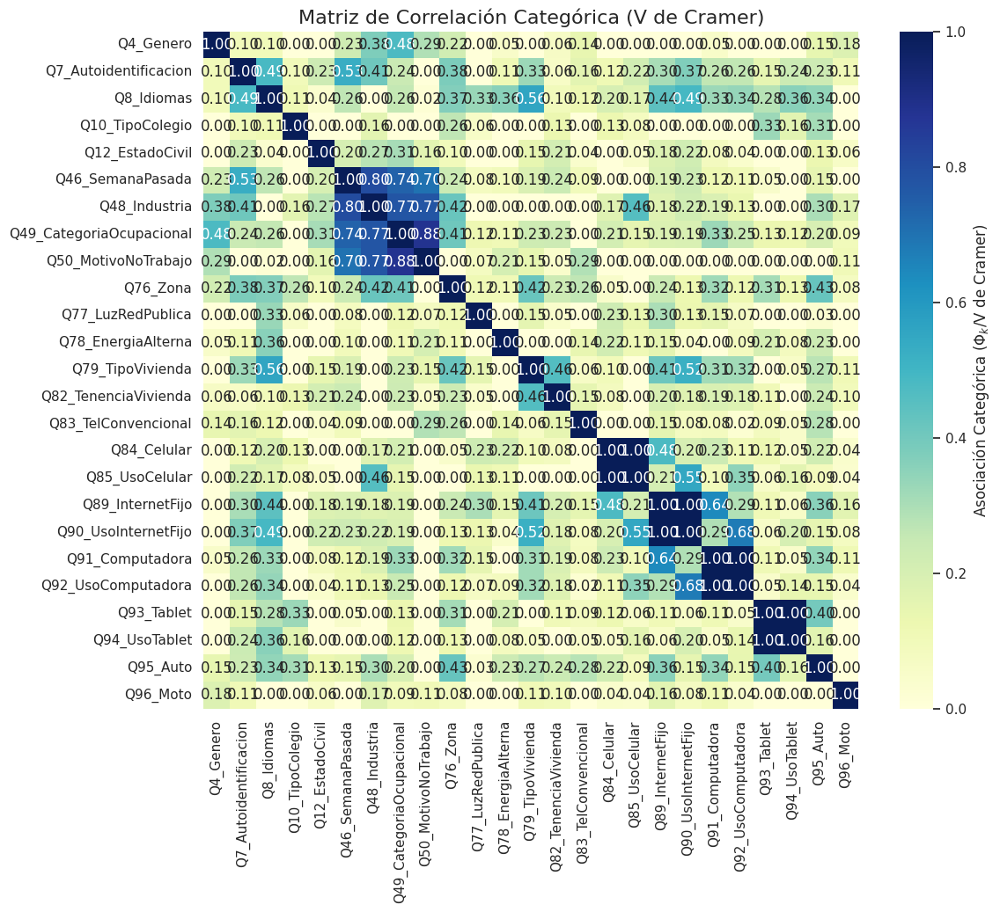

In [93]:
cat = [ #categoricas nominales no ordinales
    # demográficas, sociales
    'Q4_Genero', 'Q7_Autoidentificacion', 'Q8_Idiomas', 'Q10_TipoColegio',
    'Q12_EstadoCivil',
    # laborales
    'Q46_SemanaPasada', 'Q48_Industria',
    'Q49_CategoriaOcupacional', 'Q50_MotivoNoTrabajo',
    # vivienda
    'Q76_Zona', 'Q77_LuzRedPublica', 'Q78_EnergiaAlterna',
    'Q79_TipoVivienda', 'Q82_TenenciaVivienda',
    # tech, bienes
    'Q83_TelConvencional', 'Q84_Celular', 'Q85_UsoCelular',
    'Q89_InternetFijo', 'Q90_UsoInternetFijo', 'Q91_Computadora',
    'Q92_UsoComputadora', 'Q93_Tablet', 'Q94_UsoTablet',
    'Q95_Auto', 'Q96_Moto'
]

df_cat = df_glower[cat]
corr_matrix_lib = df_cat.phik_matrix(interval_cols=[], dropna=True)
#np.fill_diagonal(corr_matrix_lib.values, 1.00)
#mask = np.triu(np.ones_like(corr_matrix_lib, dtype=bool), k=1)
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_lib, annot=True, cmap='YlGnBu', fmt=".2f", cbar_kws={'label': 'Asociación Categórica ($\Phi_k$/V de Cramer)'}, vmin=0, vmax=1 )
plt.title("Matriz de Correlación Categórica (V de Cramer)", fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.savefig('matriz_correlacion_categorica.png', dpi=300, bbox_inches='tight')

plt.show()

### Análisis de Varianza

In [94]:
def get_poder(entropy, concentration):
    if concentration > 0.80: return "BAJO"
    if entropy > 1.0 and concentration < 0.60: return "ALTO"
    if entropy > 0.6: return "MEDIO"
    return "BAJO"
    
def analyze_feature_contribution(df):
    analysis = []
    for col in df.columns:

        top_freq = df[col].value_counts(normalize=True).iloc[0]
        
        n_unique = df[col].nunique()
        
        counts = df[col].value_counts(normalize=True)
        entropy = -np.sum(counts * np.log2(counts))
        
        analysis.append({
            'Variable': col,
            'Concentracion_Dominante': f"{top_freq:.2%}",
            'Categorías': n_unique,
            'Poder_Discriminante': get_poder(entropy, top_freq)
        })
    
    return pd.DataFrame(analysis).sort_values(by='Concentracion_Dominante', ascending=False)

In [95]:
df_analisis = analyze_feature_contribution(df_glower)
print(df_analisis)

                    Variable Concentracion_Dominante  Categorías  \
9         Q15_DifBanarVestir                  98.93%           2   
20         Q77_LuzRedPublica                  98.40%           2   
11                Q17_DifOir                  96.27%           3   
8             Q14_DifCaminar                  96.00%           3   
10             Q16_DifHablar                  96.00%           4   
31                Q93_Tablet                  88.27%           2   
32             Q94_UsoTablet                  88.27%           3   
34                  Q96_Moto                  85.33%           2   
25               Q84_Celular                  85.07%           2   
24       Q83_TelConvencional                  83.73%           2   
27          Q89_InternetFijo                  83.20%           2   
26            Q85_UsoCelular                  82.93%           3   
21        Q78_EnergiaAlterna                  82.67%           4   
18       Q50_MotivoNoTrabajo                  81

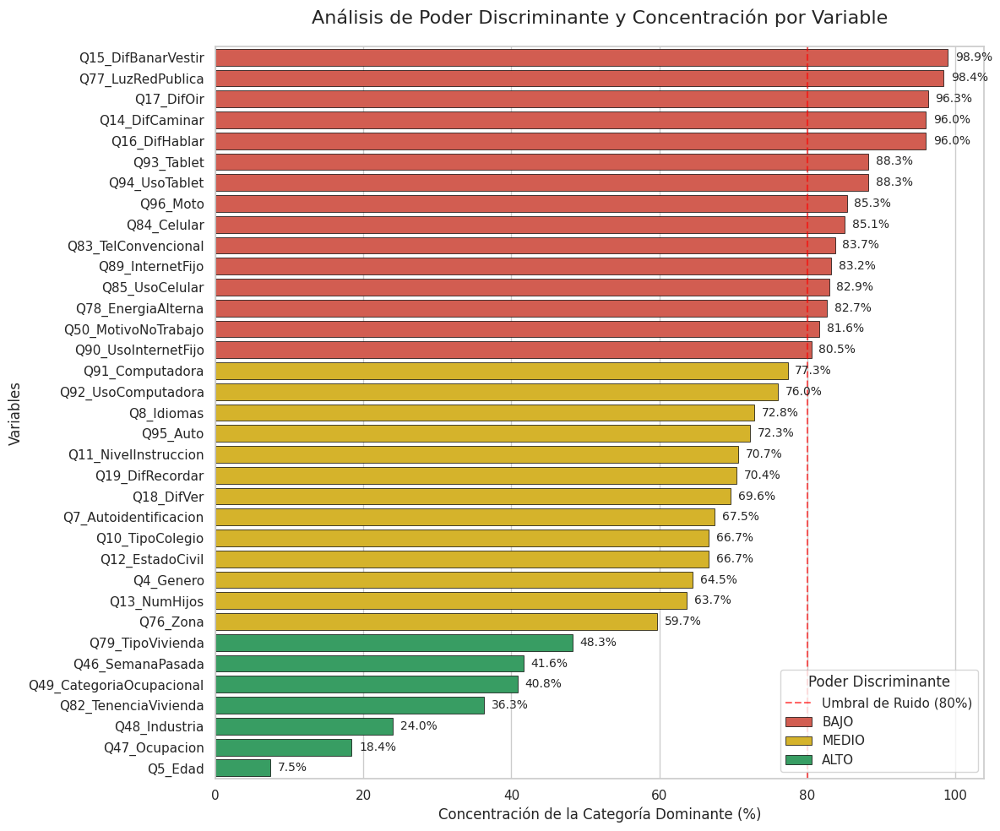

In [96]:
df_grafico = df_analisis.copy()
df_grafico['Concentracion_Num'] = (
    df_grafico['Concentracion_Dominante']
    .str.replace('%', '', regex=False)
    .astype(float)
)

df_grafico = df_grafico.sort_values('Concentracion_Num', ascending=False)

plt.figure(figsize=(12, 10))
sns.set_theme(style="whitegrid")

colores_dict = {
    'BAJO': '#E74C3C',   
    'MEDIO': '#F1C40F', 
    'ALTO': '#27AE60'   
}

ax = sns.barplot(
    data=df_grafico,
    x='Concentracion_Num',
    y='Variable',
    hue='Poder_Discriminante',
    palette=colores_dict,
    hue_order=['BAJO', 'MEDIO', 'ALTO'],
    dodge=False,
    edgecolor='black',
    linewidth=0.5
)

plt.axvline(x=80, color='red', linestyle='--', alpha=0.6, label='Umbral de Ruido (80%)')

plt.title('Análisis de Poder Discriminante y Concentración por Variable', fontsize=16, pad=20)
plt.xlabel('Concentración de la Categoría Dominante (%)', fontsize=12)
plt.ylabel('Variables', fontsize=12)
plt.legend(title='Poder Discriminante', loc='lower right')

# Añadir los porcentajes al final de las barras para precisión
for p in ax.patches:
    width = p.get_width()
    if width > 0:
        ax.annotate(f'{width:.1f}%', 
                    (width + 1, p.get_y() + p.get_height()/2), 
                    va='center', fontsize=10)

plt.tight_layout()
plt.show()

## Depuración de Variables

In [97]:
if not df.empty:
  drop_columns = [ #variables que tentativamente no van a ser consideradas dentro del estudio. OJO, pueden reforzar discursos a partir de hallazgos: Variables Ilustrativas (o Suplementarias).
      'Q77_LuzRedPublica',
      'Q93_Tablet',
      'Q94_UsoTablet',
      'Q96_Moto',
      'Q83_TelConvencional',
      'Q85_UsoCelular',
      'Q78_EnergiaAlterna',
      'Q50_MotivoNoTrabajo',
      'Q90_UsoInternetFijo',
      'Q92_UsoComputadora',
      #no se desea agrupar por detalles de ocupación
      'Q46_SemanaPasada',
      'Q49_CategoriaOcupacional',
      'Q48_Industria',
      'Q79_TipoVivienda'
      ] #PARA EVITAR QUE los individuos SE agrupEN por tecnología en lugar de por perfil sociodemográfico.

df_glower = df_glower.drop(columns=drop_columns, axis=1)
print(f"Dimensiones: {df_glower.shape}")
display(df_glower.head())

Dimensiones: (375, 21)


,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q11_NivelInstruccion,Q12_EstadoCivil,Q13_NumHijos,Q14_DifCaminar,Q15_DifBanarVestir,Q16_DifHablar,Q17_DifOir,Q18_DifVer,Q19_DifRecordar,Q47_Ocupacion,Q76_Zona,Q82_TenenciaVivienda,Q84_Celular,Q89_InternetFijo,Q91_Computadora,Q95_Auto
0,1,24,6,2,1,6,6,0,1,1,1,1,1,1,99,2,4,1,2,2,2
1,1,17,6,2,2,6,6,0,1,1,1,1,1,1,99,1,1,1,1,1,1
2,1,32,6,2,3,6,6,0,1,1,1,1,1,1,5,1,4,1,1,1,2
3,2,22,6,2,4,6,6,0,1,1,1,1,2,1,99,1,1,1,1,1,1
4,1,26,8,7,2,6,6,0,1,1,1,1,1,1,1,1,4,1,1,1,1


### Ajuste de variable de Discapacidad (fusión de variables Q14', 'Q15', 'Q16', 'Q17', 'Q18', 'Q19')

In [98]:
discapacidad_cols = ['Q14_DifCaminar', 'Q15_DifBanarVestir', 'Q16_DifHablar', 'Q17_DifOir', 'Q18_DifVer', 'Q19_DifRecordar']
df_glower['Q99_Tiene_Discapacidad'] = df_glower[discapacidad_cols].gt(1).any(axis=1).astype(int) #grados de discapacidad por cada tipo

### Ajuste de variable de Ocupación - Trabajo

In [99]:
df_glower['Q98_Trabaja'] = (
    df_glower['Q47_Ocupacion'].notnull() & 
    (df_glower['Q47_Ocupacion'] != 99)
)
df_glower['Q98_Trabaja'] = df_glower['Q98_Trabaja'].astype(int)
df_glower.head()

,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q11_NivelInstruccion,Q12_EstadoCivil,Q13_NumHijos,Q14_DifCaminar,Q15_DifBanarVestir,Q16_DifHablar,Q17_DifOir,Q18_DifVer,Q19_DifRecordar,Q47_Ocupacion,Q76_Zona,Q82_TenenciaVivienda,Q84_Celular,Q89_InternetFijo,Q91_Computadora,Q95_Auto,Q99_Tiene_Discapacidad,Q98_Trabaja
0,1,24,6,2,1,6,6,0,1,1,1,1,1,1,99,2,4,1,2,2,2,0,0
1,1,17,6,2,2,6,6,0,1,1,1,1,1,1,99,1,1,1,1,1,1,0,0
2,1,32,6,2,3,6,6,0,1,1,1,1,1,1,5,1,4,1,1,1,2,0,1
3,2,22,6,2,4,6,6,0,1,1,1,1,2,1,99,1,1,1,1,1,1,1,0
4,1,26,8,7,2,6,6,0,1,1,1,1,1,1,1,1,4,1,1,1,1,0,1


### Ajuste variable TieneHijos

In [100]:
def categorizar_hijos(n):
    if n == 0: return 0
    elif 1 <= n <= 2: return 1
    else: return 2
        
#df_glower['Q97_TieneHijos'] = (df_glower['Q13_NumHijos'] > 0).astype(int)
df_glower['Q100_Carga_Familiar_ord'] = df_glower['Q13_NumHijos'].apply(categorizar_hijos)

In [101]:
df_glower.head(100)

,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q11_NivelInstruccion,Q12_EstadoCivil,Q13_NumHijos,Q14_DifCaminar,Q15_DifBanarVestir,Q16_DifHablar,Q17_DifOir,Q18_DifVer,Q19_DifRecordar,Q47_Ocupacion,Q76_Zona,Q82_TenenciaVivienda,Q84_Celular,Q89_InternetFijo,Q91_Computadora,Q95_Auto,Q99_Tiene_Discapacidad,Q98_Trabaja,Q100_Carga_Familiar_ord
0,1,24,6,2,1,6,6,0,1,1,1,1,1,1,99,2,4,1,2,2,2,0,0,0
1,1,17,6,2,2,6,6,0,1,1,1,1,1,1,99,1,1,1,1,1,1,0,0,0
2,1,32,6,2,3,6,6,0,1,1,1,1,1,1,5,1,4,1,1,1,2,0,1,0
3,2,22,6,2,4,6,6,0,1,1,1,1,2,1,99,1,1,1,1,1,1,1,0,0
4,1,26,8,7,2,6,6,0,1,1,1,1,1,1,1,1,4,1,1,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1,40,5,6,1,8,1,5,1,1,1,1,2,2,3,2,5,1,1,2,2,1,1,2
96,1,19,6,2,1,6,6,0,1,1,1,1,1,1,5,2,4,1,1,2,2,0,1,0
97,2,21,6,2,2,9,6,0,1,1,1,1,1,1,4,1,1,1,1,1,1,0,1,0
98,1,68,6,2,1,9,6,3,1,1,1,1,2,1,3,1,2,1,1,1,2,1,1,2


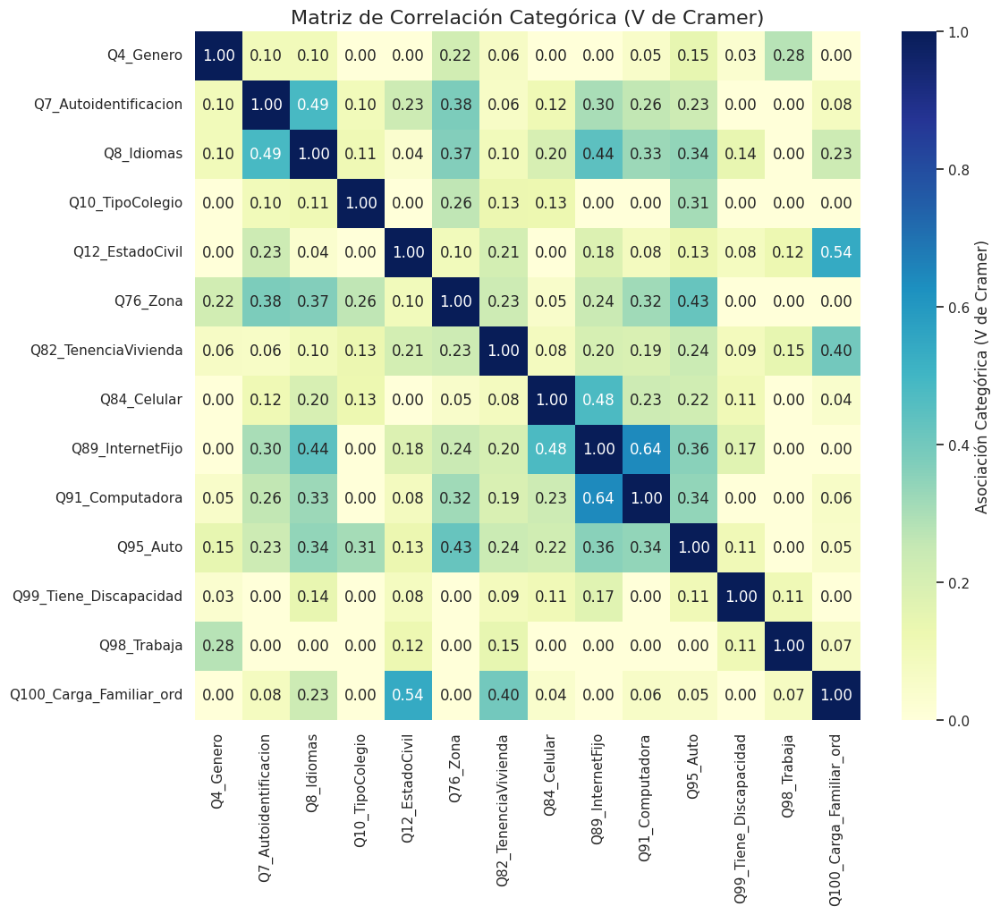

In [102]:
#Analisis V de Creames con categoricas nominales finales
cat_cols_cramer = [
    'Q4_Genero',
    'Q7_Autoidentificacion',
    'Q8_Idiomas',
    'Q10_TipoColegio',
    'Q12_EstadoCivil',
    'Q76_Zona',
    'Q82_TenenciaVivienda',
    'Q84_Celular',
    'Q89_InternetFijo',
    'Q91_Computadora',
    'Q95_Auto',
    'Q99_Tiene_Discapacidad',    
    'Q98_Trabaja',
    'Q100_Carga_Familiar_ord'
]

df_cat = df_glower[cat_cols_cramer]
corr_matrix_lib = df_cat.phik_matrix(interval_cols=[], dropna=True)
#np.fill_diagonal(corr_matrix_lib.values, 1.00)
#mask = np.triu(np.ones_like(corr_matrix_lib, dtype=bool), k=1)
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_lib, annot=True, cmap='YlGnBu', fmt=".2f", cbar_kws={'label': 'Asociación Categórica (V de Cramer)'}, vmin=0, vmax=1 )
plt.title("Matriz de Correlación Categórica (V de Cramer)", fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.savefig('matriz_correlacion_categoricaf.png', dpi=300, bbox_inches='tight')
plt.show()

#check_collinearity → Detecta predictores demasiado correlacionados.

### Ajuste variable Instrucción

In [103]:
#Estandarizar cpdificación para nivel de isntrucción

# Q11_NivelInstruccion
#orden_instruccion = ['6','7','8','9','10','11']
#map_instruccion = {cat: i for i, cat in enumerate(orden_instruccion, start=6)}
#df_glower['Q11_NivelInstruccion'] = pd.Categorical(
#    df_glower['Q11_NivelInstruccion'],
#    categories=orden_instruccion,
#    ordered=True
#)

orden_instruccion = ['6', '7', '8', '9', '10', '11']
cat_type = CategoricalDtype(categories=orden_instruccion, ordered=True)

df_glower['Q11_NivelInstruccion_cat'] = (
    df_glower['Q11_NivelInstruccion']
    .astype(str)
    .astype(cat_type)
)

#df['Q11_NivelInstruccion_ord'] = pd.to_numeric(df['Q11_NivelInstruccion_ord'], errors='coerce')

df_glower['Q11_NivelInstruccion_ord'] = (
    df_glower['Q11_NivelInstruccion_cat']
    .cat.codes
    .astype('int')     # 0,1,2,3,4,5
)

df_glower = df_glower.drop(columns=['Q11_NivelInstruccion_cat','Q11_NivelInstruccion'], errors='ignore')
df_glower

,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q12_EstadoCivil,Q13_NumHijos,Q14_DifCaminar,Q15_DifBanarVestir,Q16_DifHablar,Q17_DifOir,Q18_DifVer,Q19_DifRecordar,Q47_Ocupacion,Q76_Zona,Q82_TenenciaVivienda,Q84_Celular,Q89_InternetFijo,Q91_Computadora,Q95_Auto,Q99_Tiene_Discapacidad,Q98_Trabaja,Q100_Carga_Familiar_ord,Q11_NivelInstruccion_ord
0,1,24,6,2,1,6,0,1,1,1,1,1,1,99,2,4,1,2,2,2,0,0,0,0
1,1,17,6,2,2,6,0,1,1,1,1,1,1,99,1,1,1,1,1,1,0,0,0,0
2,1,32,6,2,3,6,0,1,1,1,1,1,1,5,1,4,1,1,1,2,0,1,0,0
3,2,22,6,2,4,6,0,1,1,1,1,2,1,99,1,1,1,1,1,1,1,0,0,0
4,1,26,8,7,2,6,0,1,1,1,1,1,1,1,1,4,1,1,1,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
370,2,60,6,7,2,5,2,1,1,1,1,1,1,99,1,1,2,1,1,1,0,0,1,2
371,2,19,1,2,1,2,2,1,1,1,1,1,1,9,2,3,1,1,1,2,0,1,1,0
372,2,27,6,2,1,1,1,1,1,1,1,1,2,6,2,3,1,1,1,2,1,1,1,0
373,1,26,8,2,1,6,0,1,1,3,3,1,1,9,2,6,1,1,1,2,1,1,0,0


In [104]:
df_glower = df_glower.drop(columns=['Q47_Ocupacion'], errors='ignore')

In [105]:
df_glower.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375 entries, 0 to 374
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Q4_Genero                 375 non-null    category
 1   Q5_Edad                   375 non-null    int64   
 2   Q7_Autoidentificacion     375 non-null    category
 3   Q8_Idiomas                375 non-null    category
 4   Q10_TipoColegio           375 non-null    category
 5   Q12_EstadoCivil           375 non-null    category
 6   Q13_NumHijos              375 non-null    int64   
 7   Q14_DifCaminar            375 non-null    int64   
 8   Q15_DifBanarVestir        375 non-null    int64   
 9   Q16_DifHablar             375 non-null    int64   
 10  Q17_DifOir                375 non-null    int64   
 11  Q18_DifVer                375 non-null    int64   
 12  Q19_DifRecordar           375 non-null    int64   
 13  Q76_Zona                  375 non-null    category

In [106]:
#print(df_glower['Q84_Celular'].unique())
#print(type(df_glower['Q84_Celular'].iloc[0]))

In [107]:
df_glower

,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q12_EstadoCivil,Q13_NumHijos,Q14_DifCaminar,Q15_DifBanarVestir,Q16_DifHablar,Q17_DifOir,Q18_DifVer,Q19_DifRecordar,Q76_Zona,Q82_TenenciaVivienda,Q84_Celular,Q89_InternetFijo,Q91_Computadora,Q95_Auto,Q99_Tiene_Discapacidad,Q98_Trabaja,Q100_Carga_Familiar_ord,Q11_NivelInstruccion_ord
0,1,24,6,2,1,6,0,1,1,1,1,1,1,2,4,1,2,2,2,0,0,0,0
1,1,17,6,2,2,6,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0
2,1,32,6,2,3,6,0,1,1,1,1,1,1,1,4,1,1,1,2,0,1,0,0
3,2,22,6,2,4,6,0,1,1,1,1,2,1,1,1,1,1,1,1,1,0,0,0
4,1,26,8,7,2,6,0,1,1,1,1,1,1,1,4,1,1,1,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
370,2,60,6,7,2,5,2,1,1,1,1,1,1,1,1,2,1,1,1,0,0,1,2
371,2,19,1,2,1,2,2,1,1,1,1,1,1,2,3,1,1,1,2,0,1,1,0
372,2,27,6,2,1,1,1,1,1,1,1,1,2,2,3,1,1,1,2,1,1,1,0
373,1,26,8,2,1,6,0,1,1,3,3,1,1,2,6,1,1,1,2,1,1,0,0


### Ajuste variable IAT (Índice de Acceso Tecnológico)

In [108]:
tech_map = {'1': 1, '2': 0}
cols_tech = ['Q84_Celular', 'Q89_InternetFijo', 'Q91_Computadora']

for col in cols_tech:
    df_glower[col] = df_glower[col].astype(str).str.strip().map(tech_map).fillna(0).astype(int)

print(df_glower[cols_tech].sum())

df_glower['Q101_IAT_Acceso'] = df_glower[cols_tech].sum(axis=1)
#df_final = df_glower.drop(columns=cols_tech)

Q84_Celular         319
Q89_InternetFijo    312
Q91_Computadora     290
dtype: int64


In [109]:
df_glower

,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q12_EstadoCivil,Q13_NumHijos,Q14_DifCaminar,Q15_DifBanarVestir,Q16_DifHablar,Q17_DifOir,Q18_DifVer,Q19_DifRecordar,Q76_Zona,Q82_TenenciaVivienda,Q84_Celular,Q89_InternetFijo,Q91_Computadora,Q95_Auto,Q99_Tiene_Discapacidad,Q98_Trabaja,Q100_Carga_Familiar_ord,Q11_NivelInstruccion_ord,Q101_IAT_Acceso
0,1,24,6,2,1,6,0,1,1,1,1,1,1,2,4,1,0,0,2,0,0,0,0,1
1,1,17,6,2,2,6,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,3
2,1,32,6,2,3,6,0,1,1,1,1,1,1,1,4,1,1,1,2,0,1,0,0,3
3,2,22,6,2,4,6,0,1,1,1,1,2,1,1,1,1,1,1,1,1,0,0,0,3
4,1,26,8,7,2,6,0,1,1,1,1,1,1,1,4,1,1,1,1,0,1,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
370,2,60,6,7,2,5,2,1,1,1,1,1,1,1,1,0,1,1,1,0,0,1,2,2
371,2,19,1,2,1,2,2,1,1,1,1,1,1,2,3,1,1,1,2,0,1,1,0,3
372,2,27,6,2,1,1,1,1,1,1,1,1,2,2,3,1,1,1,2,1,1,1,0,3
373,1,26,8,2,1,6,0,1,1,3,3,1,1,2,6,1,1,1,2,1,1,0,0,3


In [110]:
cont_cols = [
    'Q5_Edad',
    'Q11_NivelInstruccion_ord',
    'Q100_Carga_Familiar_ord'
]

nombres_nuevos = {
    'Q5_Edad': 'Edad',
    'Q11_NivelInstruccion_ord': 'Nivel Educativo',
    'Q100_Carga_Familiar_ord': 'Carga Familiar'
}

# Renombrar las columnas
df_renamed = df_glower[cont_cols].rename(columns=nombres_nuevos)

corr_spearman = df_renamed.corr(method='spearman')
corr_spearman_abs = corr_spearman.abs()
print(corr_spearman)
print(corr_spearman_abs)

                     Edad  Nivel Educativo  Carga Familiar
Edad             1.000000         0.339941        0.553201
Nivel Educativo  0.339941         1.000000        0.031980
Carga Familiar   0.553201         0.031980        1.000000
                     Edad  Nivel Educativo  Carga Familiar
Edad             1.000000         0.339941        0.553201
Nivel Educativo  0.339941         1.000000        0.031980
Carga Familiar   0.553201         0.031980        1.000000


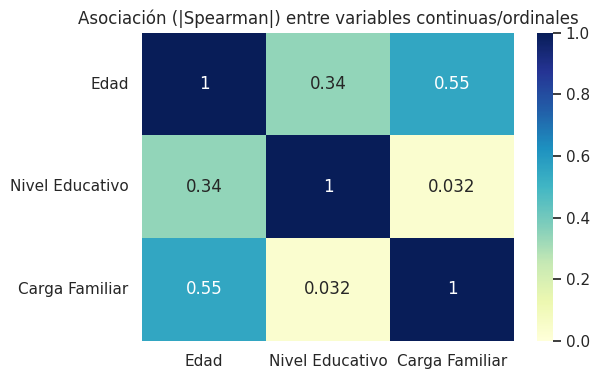

In [111]:
plt.figure(figsize=(6, 4))
sns.heatmap(corr_spearman_abs, annot=True, vmin=0, vmax=1, cmap="YlGnBu")
plt.title("Asociación (|Spearman|) entre variables continuas/ordinales")

plt.savefig('Spearman.png', dpi=300, bbox_inches='tight')

plt.show()

### Variables finales

In [112]:
variables_finales = [
    'Q4_Genero',
    'Q5_Edad',
    'Q7_Autoidentificacion',
    'Q8_Idiomas',
    'Q10_TipoColegio',
    'Q11_NivelInstruccion_ord',
    'Q12_EstadoCivil',
    'Q76_Zona',
    'Q82_TenenciaVivienda',
    #'Q84_Celular',
    #'Q89_InternetFijo',
    #'Q91_Computadora',
    'Q95_Auto',
    #'Q97_TieneHijos',
    'Q98_Trabaja',
    'Q99_Tiene_Discapacidad', # eje de vulnerabilidad
    'Q100_Carga_Familiar_ord',
    'Q101_IAT_Acceso'
]
df_glower_f = df_glower[variables_finales].copy()
df_glower_f

,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q11_NivelInstruccion_ord,Q12_EstadoCivil,Q76_Zona,Q82_TenenciaVivienda,Q95_Auto,Q98_Trabaja,Q99_Tiene_Discapacidad,Q100_Carga_Familiar_ord,Q101_IAT_Acceso
0,1,24,6,2,1,0,6,2,4,2,0,0,0,1
1,1,17,6,2,2,0,6,1,1,1,0,0,0,3
2,1,32,6,2,3,0,6,1,4,2,1,0,0,3
3,2,22,6,2,4,0,6,1,1,1,0,1,0,3
4,1,26,8,7,2,0,6,1,4,1,1,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
370,2,60,6,7,2,2,5,1,1,1,0,0,1,2
371,2,19,1,2,1,0,2,2,3,2,1,0,1,3
372,2,27,6,2,1,0,1,2,3,2,1,1,1,3
373,1,26,8,2,1,0,6,2,6,2,1,1,0,3


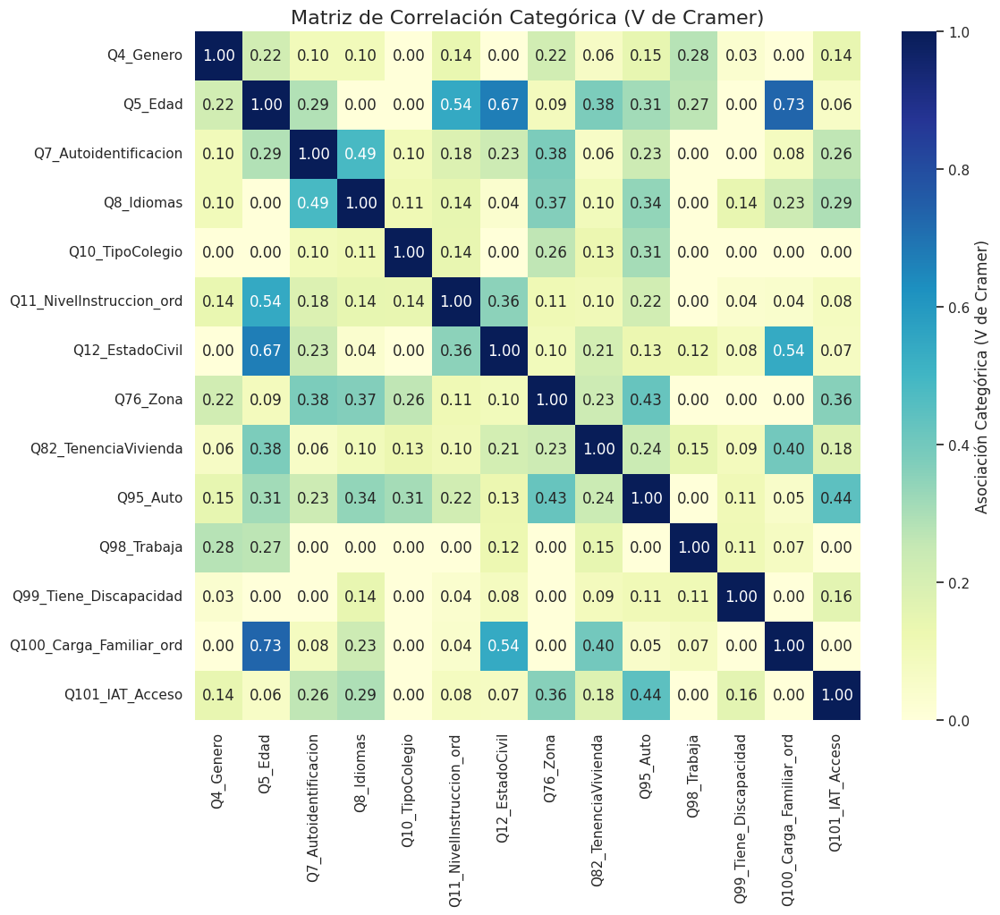

In [113]:
#Analisis V de Creames con categoricas nominales finales

df_cat = df_glower[variables_finales]
corr_matrix_lib = df_cat.phik_matrix(interval_cols=[], dropna=True)
#np.fill_diagonal(corr_matrix_lib.values, 1.00)
#mask = np.triu(np.ones_like(corr_matrix_lib, dtype=bool), k=1)
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_lib, annot=True, cmap='YlGnBu', fmt=".2f", cbar_kws={'label': 'Asociación Categórica (V de Cramer)'}, vmin=0, vmax=1 )
plt.title("Matriz de Correlación Categórica (V de Cramer)", fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.savefig('matriz_correlacion_categoricaf2.png', dpi=300, bbox_inches='tight')
plt.show()

#check_collinearity → Detecta predictores demasiado correlacionados.

In [114]:
def types_val(df):
    reporte = []
    for col in df.columns:
        n_unicos = df[col].nunique()
        tipo_dato = df[col].dtype
        valores = sorted(df[col].unique().tolist())[:5]
        
        if col.endswith('_ord') or col.endswith('_Acceso'):
            naturaleza = "ORDINAL (Jerarquía)"
        elif n_unicos == 2:
            naturaleza = "BINARIA (Nominal)"
        elif tipo_dato == 'int64' or tipo_dato == 'float64':
            naturaleza = "NUMÉRICA (Escalar)"
        else:
            naturaleza = "NOMINAL (Identidad)"
            
        reporte.append({
            'Variable': col,
            'N_Unicos': n_unicos,
            'Valores_Ejemplo': valores,
            'Naturaleza_Propuesta': naturaleza
        })
    return pd.DataFrame(reporte)

print(types_val(df_glower_f))

                    Variable  N_Unicos       Valores_Ejemplo  \
0                  Q4_Genero         2                [1, 2]   
1                    Q5_Edad        39  [17, 18, 19, 20, 21]   
2      Q7_Autoidentificacion         7       [1, 2, 4, 5, 6]   
3                 Q8_Idiomas         6       [1, 2, 6, 7, 8]   
4            Q10_TipoColegio         4          [1, 2, 3, 4]   
5   Q11_NivelInstruccion_ord         5       [0, 1, 2, 3, 4]   
6            Q12_EstadoCivil         5       [1, 2, 3, 5, 6]   
7                   Q76_Zona         2                [1, 2]   
8       Q82_TenenciaVivienda         6       [1, 2, 3, 4, 5]   
9                   Q95_Auto         2                [1, 2]   
10               Q98_Trabaja         2                [0, 1]   
11    Q99_Tiene_Discapacidad         2                [0, 1]   
12   Q100_Carga_Familiar_ord         3             [0, 1, 2]   
13           Q101_IAT_Acceso         4          [0, 1, 2, 3]   

   Naturaleza_Propuesta  
0     BINARIA

In [115]:
auto_map = {'1': 1, '2': 0, 1: 1, 2: 0}

df_glower_f['Q95_Auto'] = (
    df_glower_f['Q95_Auto']
    .astype(str)
    .str.strip()
    .map({'1': 1, '2': 0})
    .fillna(0)
    .astype(int)
)

print(f"Valores únicos en Q95_Auto: {df_glower_f['Q95_Auto'].unique()}")
print(df_glower_f['Q95_Auto'].value_counts(normalize=True))

Valores únicos en Q95_Auto: [0 1]
Q95_Auto
0    0.722667
1    0.277333
Name: proportion, dtype: float64


In [116]:
cols_nominales = [
    'Q4_Genero', 'Q7_Autoidentificacion', 'Q8_Idiomas', 
    'Q10_TipoColegio', 'Q12_EstadoCivil', 'Q76_Zona', 
    'Q82_TenenciaVivienda', 'Q95_Auto'
]

cols_ordinales = [
    'Q11_NivelInstruccion_ord', 'Q100_Carga_Familiar_ord', 'Q101_IAT_Acceso'
]

cols_numericas = ['Q5_Edad']

cols_binarias_check = ['Q98_Trabaja', 'Q99_Tiene_Discapacidad']

for col in cols_nominales:
    df_glower_f[col] = df_glower_f[col].astype('category')

for col in cols_ordinales + cols_numericas + cols_binarias_check:
    df_glower_f[col] = df_glower_f[col].astype(float)

print(df_glower_f.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375 entries, 0 to 374
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Q4_Genero                 375 non-null    category
 1   Q5_Edad                   375 non-null    float64 
 2   Q7_Autoidentificacion     375 non-null    category
 3   Q8_Idiomas                375 non-null    category
 4   Q10_TipoColegio           375 non-null    category
 5   Q11_NivelInstruccion_ord  375 non-null    float64 
 6   Q12_EstadoCivil           375 non-null    category
 7   Q76_Zona                  375 non-null    category
 8   Q82_TenenciaVivienda      375 non-null    category
 9   Q95_Auto                  375 non-null    category
 10  Q98_Trabaja               375 non-null    float64 
 11  Q99_Tiene_Discapacidad    375 non-null    float64 
 12  Q100_Carga_Familiar_ord   375 non-null    float64 
 13  Q101_IAT_Acceso           375 non-null    float64 

In [117]:
import prince

df = df_glower_f.copy()

n_components = 15

famd = prince.FAMD(
    n_components=n_components,
    n_iter=10,
    copy=True,
    check_input=True,
    engine="sklearn",
    random_state=42
)

famd = famd.fit(df)

X_famd = famd.row_coordinates(df)   # DataFrame (375 x n_components)

pct = np.array(famd.percentage_of_variance_, dtype=float)  # típicamente 0–100
expl = pct / 100.0

cumexpl = np.array(famd.cumulative_percentage_of_variance_, dtype=float) / 100.0

print("Explained inertia:", np.round(expl, 4))
print("Cumulative:", np.round(cumexpl, 4))

# selección de k por umbral (p.ej., 80%)
k = int(np.argmax(cumexpl >= 0.80) + 1) if (cumexpl >= 0.80).any() else n_components
print("k elegido:", k)

Xk = X_famd.iloc[:, :k].to_numpy()

eig = np.array(famd.eigenvalues_, dtype=float)
print("Eigenvalues:", np.round(eig, 4))
print("Total inertia:", famd.total_inertia_)

Explained inertia: [0.0896 0.0572 0.0529 0.0517 0.0487 0.0447 0.0433 0.0409 0.0403 0.0387
 0.0381 0.0368 0.0362 0.0361 0.0349]
Cumulative: [0.0896 0.1468 0.1997 0.2515 0.3002 0.3449 0.3881 0.429  0.4693 0.508
 0.5461 0.5829 0.6191 0.6552 0.6901]
k elegido: 15
Eigenvalues: [9.8574 6.2904 5.8234 5.6893 5.3599 4.9131 4.7625 4.4989 4.4327 4.2523
 4.1882 4.0495 3.981  3.9704 3.8428]
Total inertia: 110.0


In [118]:
#OUTPUT = "/kaggle/working/Data_Gower.xlsx"
#df_glower_f.to_excel(OUTPUT, index=False)

# Aplicación GOWER

### 1. Definición de distancia

In [119]:
# especiicación de pesos (segmento crítico para modelo!!)
# Referencia: Weight Argument: https://towardsdatascience.com/gowers-distance-for-mixed-categorical-and-numerical-data-799fedd1080c/
ordered_cols = [
    'Q4_Genero',
    'Q5_Edad', 
    'Q7_Autoidentificacion',
    'Q8_Idiomas',
    'Q10_TipoColegio',
    'Q11_NivelInstruccion_ord',
    'Q12_EstadoCivil',         
    'Q76_Zona',
    'Q82_TenenciaVivienda',
    'Q95_Auto',
    'Q98_Trabaja',
    'Q99_Tiene_Discapacidad',
    'Q100_Carga_Familiar_ord',
    'Q101_IAT_Acceso'
]

df_gower_clus = df_glower_f[ordered_cols].copy()

###nmi

In [120]:
target_col = 'Q11_NivelInstruccion_ord'

nmi_results = {}
for col in ordered_cols:
    # NMI maneja bien variables categóricas y numéricas discretizadas
    score = normalized_mutual_info_score(df_glower_f[target_col], df_glower_f[col])
    nmi_results[col] = score

nmi_weights = {k: round(v * 10, 2) for k, v in nmi_results.items()}

print("Pesos calculados mediante NMI (Justificación Estadística):")
print(nmi_weights)

Pesos calculados mediante NMI (Justificación Estadística):
{'Q4_Genero': 0.23, 'Q5_Edad': 1.28, 'Q7_Autoidentificacion': 0.63, 'Q8_Idiomas': 0.52, 'Q10_TipoColegio': 0.36, 'Q11_NivelInstruccion_ord': 10.0, 'Q12_EstadoCivil': 0.52, 'Q76_Zona': 0.2, 'Q82_TenenciaVivienda': 0.25, 'Q95_Auto': 0.47, 'Q98_Trabaja': 0.07, 'Q99_Tiene_Discapacidad': 0.08, 'Q100_Carga_Familiar_ord': 0.12, 'Q101_IAT_Acceso': 0.29}


In [121]:
weights = {
    'Q4_Genero': 0.5,
    'Q5_Edad': 1.2, 
    'Q7_Autoidentificacion': 0.4,
    'Q8_Idiomas':0.4,
    'Q10_TipoColegio': 0.8,
    'Q11_NivelInstruccion_ord': 2.5,  #1.0
    'Q12_EstadoCivil': 0.5,         
    'Q76_Zona': 0.5,
    'Q82_TenenciaVivienda':1.0,
    'Q95_Auto': 0.8,
    'Q98_Trabaja': 1.8,
    'Q99_Tiene_Discapacidad': 0.1,
    'Q100_Carga_Familiar_ord': 1.5,
    'Q101_IAT_Acceso': 2.0
}

In [122]:
total_w = sum(weights.values())
weights_array = np.array([weights[col] / total_w for col in ordered_cols]) #se normalizan los pesos para intepretabilidad

cat_mask = [col not in ['Q5_Edad', 'Q11_NivelInstruccion_ord','Q100_Carga_Familiar_ord','Q101_IAT_Acceso'] for col in ordered_cols] #excepto
gower_dist_matrix = gower.gower_matrix(df_gower_clus, weight=weights_array, cat_features=cat_mask) # normalizar o estandarizar interna realizada en Gower - Distancia de Disimilaridades

if gower_dist_matrix.ndim > 1 and gower_dist_matrix.shape[0] == gower_dist_matrix.shape[1]:
    # squareform para convertir la matriz de distancia cuadrada (N x N) en un vector condensado.
    try:
      dist_vector = squareform(gower_dist_matrix)
    except ValueError as e:
      print(f"Error al convertir la matriz a vector condensado: {e}")
else:
    dist_vector = gower_dist_matrix

print(gower_dist_matrix)

[[0.         0.32843137 0.33011204 ... 0.43242297 0.33431372 0.5457633 ]
 [0.32843137 0.         0.3394958  ... 0.4989496  0.40084034 0.45514706]
 [0.33011204 0.3394958  0.         ... 0.30483192 0.21008404 0.3442227 ]
 ...
 [0.43242297 0.4989496  0.30483192 ... 0.         0.22668067 0.41334033]
 [0.33431372 0.40084034 0.21008404 ... 0.22668067 0.         0.4257353 ]
 [0.5457633  0.45514706 0.3442227  ... 0.41334033 0.4257353  0.        ]]


### 1.1 Gráfica de Matriz de Gower

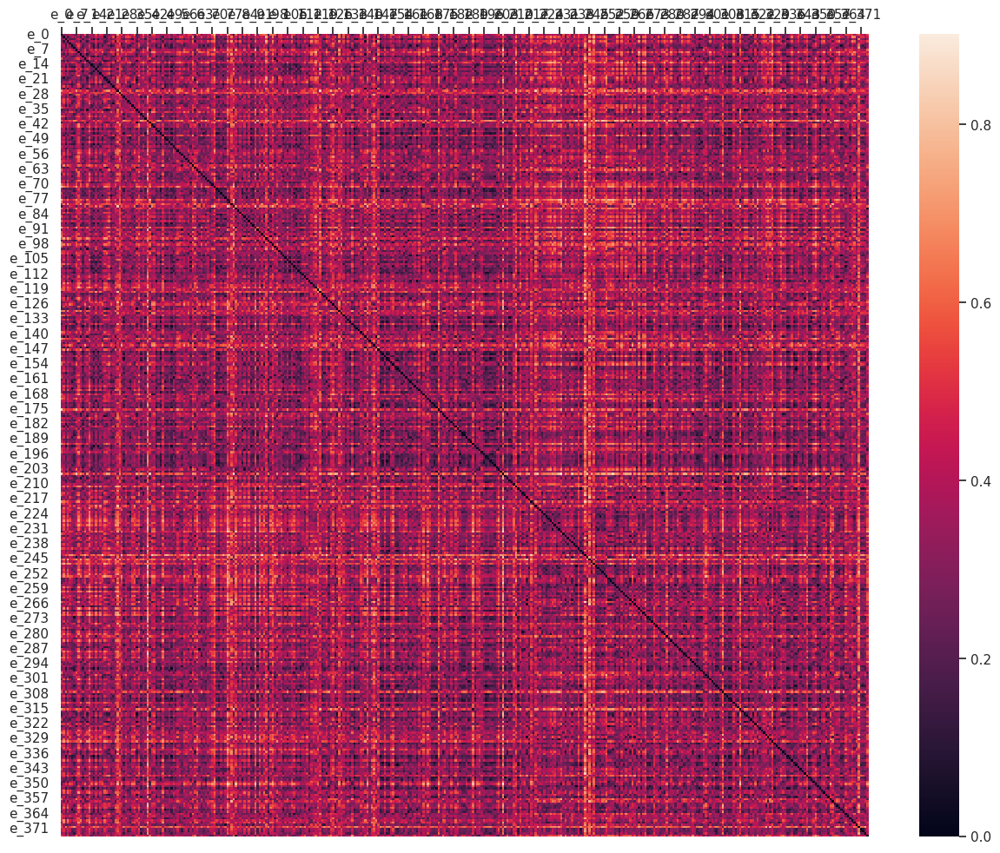

In [123]:
c_names = [f"e_{x}" for x in range(gower_dist_matrix.shape[0])]
_ = plt.figure(figsize=(15,12))
ax = sns.heatmap(data=pd.DataFrame(gower_dist_matrix, index=c_names, columns=c_names),
                 annot=False,
                 fmt='.2g')
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')

### 2. Análisis de metodod de linkeo y Cálculo de la Correlación Cofenétic (CCC)

In [124]:
# Complete Linkage: clusters más compactos y evita el efecto de encadenamiento.
hc_glower_complete = sch.linkage(dist_vector, method='complete')
coph_corr_complete, coph_dist_complete = cophenet(hc_glower_complete, dist_vector) # coeficiente Complete Linkage
print(f"1. Complete Linkage: {coph_corr_complete:.2f}")

# Average Linkage
hc_glower_average = sch.linkage(dist_vector, method='average')
coph_corr_average, coph_dist_average = cophenet(hc_glower_average, dist_vector) # coeficiente Average Linkage
print(f"2. Average Linkage: {coph_corr_average:.2f}")

# Single Linkage: sensible a outliers. Útil para estructuras alargadas.
hc_glower_single = sch.linkage(dist_vector, method='single')
coph_corr_single, coph_dist_single = cophenet(hc_glower_single, dist_vector) # coeficiente Single Linkage
print(f"3. Single Linkage: {coph_corr_single:.2f}")

#hc_glower_ward = sch.linkage(dist_vector, method='ward') # no aplica por calculo distancias y tipo de dato no concuerdan
#coph_corr_ward, coph_dist_ward = cophenet(hc_glower_ward, dist_vector) # coeficiente Single Linkage
#print(f"4. Ward Linkage: {coph_corr_ward:.2f}")

1. Complete Linkage: 0.58
2. Average Linkage: 0.65
3. Single Linkage: 0.59


### 3. Visualización de Dendograma

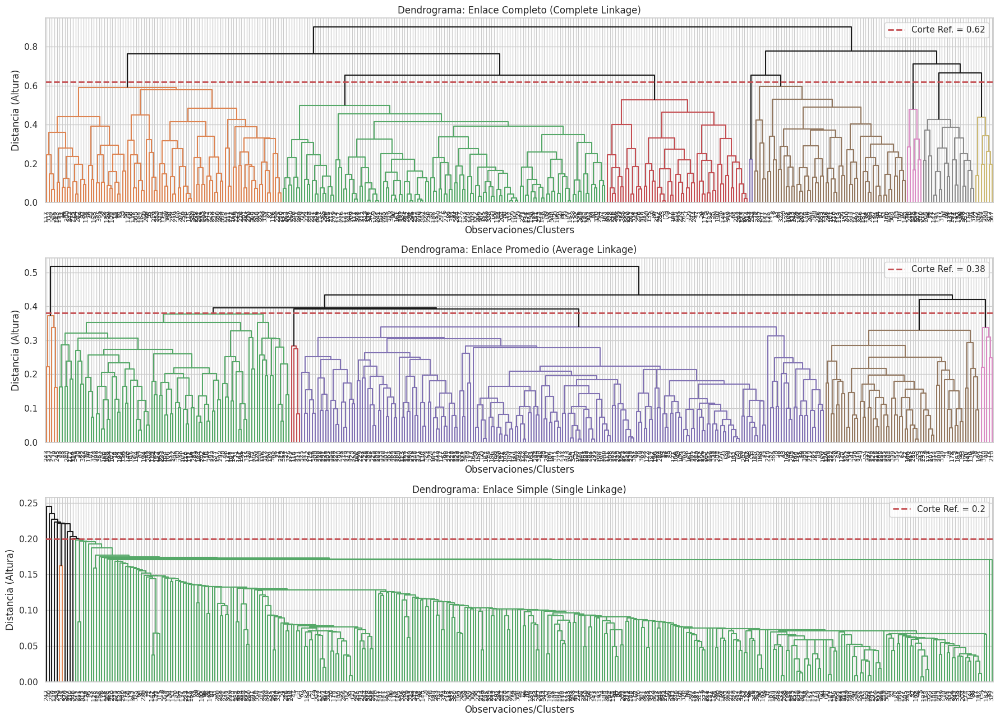

In [125]:
metodos = {
    "Enlace Completo (Complete Linkage)": {"Z": hc_glower_complete, "corte": 0.62},
    "Enlace Promedio (Average Linkage)": {"Z": hc_glower_average, "corte": 0.38},
    "Enlace Simple (Single Linkage)": {"Z": hc_glower_single, "corte": 0.20},
}

#max_distancia = 0.62
plt.figure(figsize=(18, 13))
i = 1

for nombre, datos in metodos.items():
    Z = datos["Z"]
    corte = datos["corte"]

    plt.subplot(3,1, i)
    plt.title(f'Dendrograma: {nombre}')
    plt.xlabel('Observaciones/Clusters')
    plt.ylabel('Distancia (Altura)')

    sch.dendrogram(Z,
                   leaf_rotation=90.,
                   leaf_font_size=8.,
                   truncate_mode='lastp', # solo cierto puntos (+claridad)
                   p=360,
                   color_threshold=corte,
                   above_threshold_color='k')

    plt.axhline(y=corte, color='r', linestyle='--', linewidth=2,
                  label=f'Corte Ref. = {corte}')
    plt.legend()
    i += 1

plt.tight_layout()

plt.savefig('HCA.png', dpi=300, bbox_inches='tight')

plt.show()
#Dendrogramas obtenidos mediante agrupamiento jerárquico aglomerativo con una selección de medidas de disimilitud y criterios de linkeo
#!!! Cohortes por cada linkeo considerar

### Contraste de K-Óptimo (Silhouette score basado en Gower)

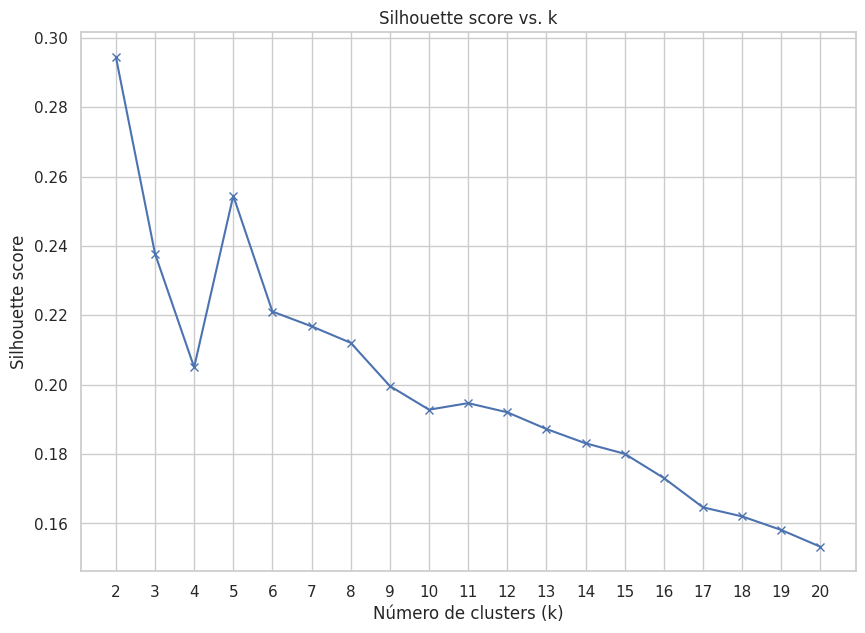

In [126]:
max_k = 20

silhouette_scores = []
for k in range(2, max_k + 1):
    clusters = fcluster(hc_glower_average, k, criterion='maxclust')
    silhouette_scores.append(silhouette_score(gower_dist_matrix, clusters, metric='precomputed'))

plt.figure(figsize=(10, 7))  # 10 pulgadas de ancho, 6 de alto
plt.plot(range(2, max_k + 1), silhouette_scores, 'bx-')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Silhouette score')
plt.title('Silhouette score vs. k')

plt.xticks(range(2, max_k + 1))

plt.savefig('Silhouette.png', dpi=300, bbox_inches='tight')

plt.show()

Refencia: https://www.researchgate.net/figure/Coeficiente-de-correlacion-cofenetica-matriz-de-similitud-original-distancia-entre_fig18_50326234

In [127]:
k_values = [2, 3,4, 5, 6, 7, 8, 9,10,11,12,13,14,15,16,17,18,19,20]
metrics = []

for k in k_values:
    clusters = fcluster(hc_glower_average, t=k, criterion='maxclust')
    db_index = davies_bouldin_score(gower_dist_matrix, clusters)
    ch_index = calinski_harabasz_score(df_glower_f, clusters)
    metrics.append((k, db_index, ch_index))

for k, db, ch in metrics:
    print(f"k = {k}: Davies-Bouldin Index = {db:.4f}, Calinski-Harabasz Index = {ch:.4f}")

k = 2: Davies-Bouldin Index = 1.0237, Calinski-Harabasz Index = 1.9295
k = 3: Davies-Bouldin Index = 1.3418, Calinski-Harabasz Index = 8.7123
k = 4: Davies-Bouldin Index = 1.3185, Calinski-Harabasz Index = 11.9994
k = 5: Davies-Bouldin Index = 1.3185, Calinski-Harabasz Index = 15.4178
k = 6: Davies-Bouldin Index = 1.2556, Calinski-Harabasz Index = 13.9283
k = 7: Davies-Bouldin Index = 1.4648, Calinski-Harabasz Index = 11.8195
k = 8: Davies-Bouldin Index = 1.4207, Calinski-Harabasz Index = 10.5960
k = 9: Davies-Bouldin Index = 1.3338, Calinski-Harabasz Index = 9.3910
k = 10: Davies-Bouldin Index = 1.3104, Calinski-Harabasz Index = 13.3556
k = 11: Davies-Bouldin Index = 1.3062, Calinski-Harabasz Index = 16.1748
k = 12: Davies-Bouldin Index = 1.2219, Calinski-Harabasz Index = 15.0033
k = 13: Davies-Bouldin Index = 1.2561, Calinski-Harabasz Index = 13.7858
k = 14: Davies-Bouldin Index = 1.2670, Calinski-Harabasz Index = 12.7679
k = 15: Davies-Bouldin Index = 1.2764, Calinski-Harabasz Index

### Asignación de cluster al df_glower_final

In [128]:
#Z_final = hc_glower_complete # CLAVE= Parametriza en base al análisis anterior
k = 5
#df_glower_sys['HAC'] = fcluster(Z_final, t=k, criterion='maxclust')
#df_glower_sys['HAC'] = df_glower_sys['HAC'].astype('category')

try:
    hac = AgglomerativeClustering(n_clusters=k, linkage="average", metric="precomputed")
except TypeError:
    hac = AgglomerativeClustering(n_clusters=k, linkage="average", affinity="precomputed")

labels = hac.fit_predict(gower_dist_matrix)
df_glower_f['cluster_hac'] = labels

## Experimento 1

### Visualización Asingación Jerarquica

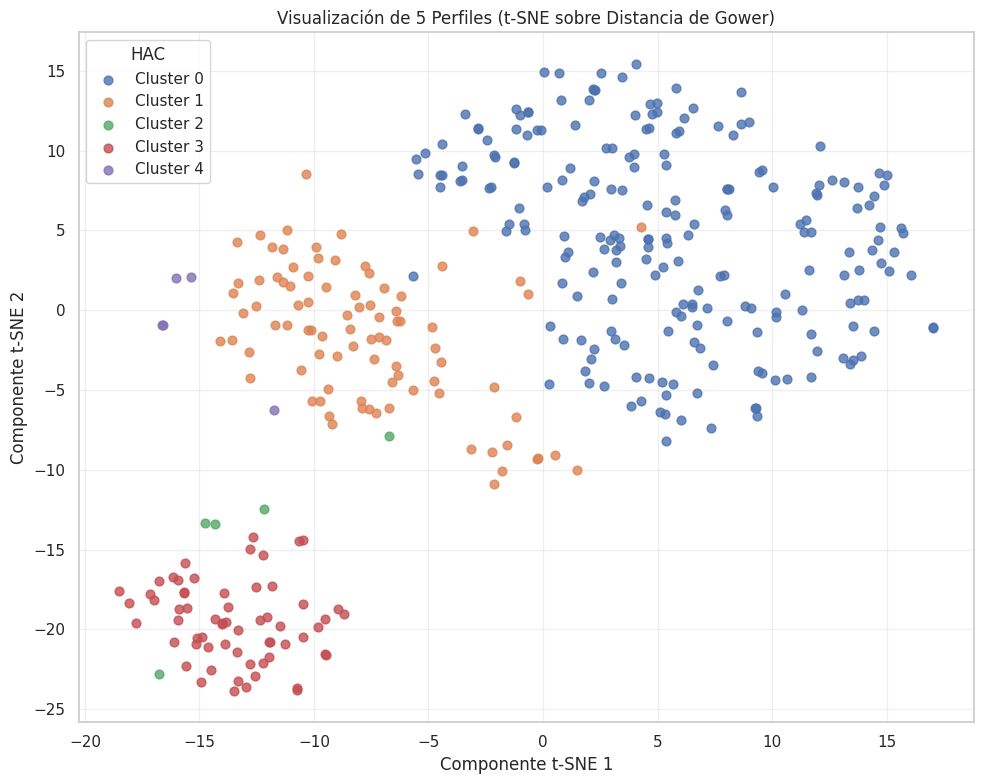

In [129]:
D = np.asarray(gower_dist_matrix, dtype=float)

tsne = TSNE(
    n_components=2,
    metric="precomputed",
    init="random", 
    perplexity=30,
    learning_rate=200,
    random_state=42
)

X_tsne = tsne.fit_transform(D)   # (n x 2)

clusters = np.unique(labels)

plt.figure(figsize=(10, 8))
for c in clusters:
    mask = (labels == c)
    plt.scatter(
        X_tsne[mask, 0],
        X_tsne[mask, 1],
        s=40,
        alpha=0.8,
        label=f"Cluster {c}"  # +1 sólo para mostrar 1..k
    )

plt.title("Visualización de 5 Perfiles (t-SNE sobre Distancia de Gower)")
plt.xlabel("Componente t-SNE 1")
plt.ylabel("Componente t-SNE 2")
plt.legend(title="HAC", loc="best")
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('TSNE.png', dpi=300, bbox_inches='tight')

plt.show()

### Evaluación HCA

In [130]:
def silhouette_por_cluster(D_gower, labels):

    D = np.asarray(D_gower, dtype=float)
    labels = np.asarray(labels)

    if D.ndim != 2 or D.shape[0] != D.shape[1]:
        raise ValueError("no es matriz cuadrada (n x n).")
    if D.shape[0] != len(labels):
        raise ValueError("error con labels")
    np.fill_diagonal(D, 0.0)
    s = silhouette_samples(D, labels, metric="precomputed")
    df = pd.DataFrame({
        "cluster": labels,
        "silhouette": s
    })
    resumen = (
        df.groupby("cluster")["silhouette"]
          .agg(
              n="count",
              mean="mean",
              median="median",
              min="min",
              max="max",
          )
          .assign(
              p25=df.groupby("cluster")["silhouette"].quantile(0.25),
              p75=df.groupby("cluster")["silhouette"].quantile(0.75),
              neg_share=df.groupby("cluster")["silhouette"].apply(lambda x: (x < 0).mean()),
              #near0_share=df.groupby("cluster")["silhouette"].apply(lambda x: (x < 0.05).mean
              near0_share=df.groupby("cluster")["silhouette"].apply(lambda x: ((x >= 0) & (x < 0.05)).mean())

          )
          .sort_values(["mean", "median"], ascending=False)
    )
    silhouette_global = silhouette_score(D, labels, metric="precomputed")
    return s, df, resumen, silhouette_global

In [131]:
def plot_silhouette(n,D_gower, labels):
    D = np.asarray(D_gower, dtype=float)
    labels = np.asarray(labels)
    np.fill_diagonal(D, 0.0)

    s = silhouette_samples(D, labels, metric="precomputed")
    sil_avg = silhouette_score(D, labels, metric="precomputed")

    clusters = np.unique(labels)
    k = len(clusters)

    fig, ax = plt.subplots(figsize=(10, 6))

    y_lower = 10
    for c in clusters:
        vals = np.sort(s[labels == c])
        size_c = vals.shape[0]
        y_upper = y_lower + size_c

        ax.fill_betweenx(np.arange(y_lower, y_upper), 0, vals, alpha=0.7)
        ax.text(-0.05, (y_lower + y_upper) / 2, str(c))

        y_lower = y_upper + 10  # espacio entre clusters

    ax.axvline(sil_avg, linestyle="--")
    ax.set_title(f"Silhouette plot (k={k}) | Silhouette medio = {sil_avg:.3f}")
    ax.set_xlabel("Coeficiente Silhouette")
    ax.set_ylabel("Clusters")
    ax.set_yticks([])
    ax.set_xlim(-0.2, 1.0)

    plt.savefig(n, dpi=300, bbox_inches='tight')
    
    plt.show()

Silhouette global: 0.2544752197812492
           n      mean    median       min       max       p25       p75  \
cluster                                                                    
3         62  0.342236  0.378057 -0.040866  0.478391  0.275784  0.432162   
0        215  0.269674  0.287618 -0.091400  0.358764  0.241979  0.315781   
4          5  0.251216  0.284916  0.126075  0.325137  0.205504  0.314446   
2          5  0.236324  0.268811  0.106502  0.345943  0.178113  0.282250   
1         88  0.156727  0.169918 -0.258074  0.314993  0.108395  0.238911   

         neg_share  near0_share  
cluster                          
3         0.016129     0.016129  
0         0.009302     0.004651  
4         0.000000     0.000000  
2         0.000000     0.000000  
1         0.079545     0.056818  


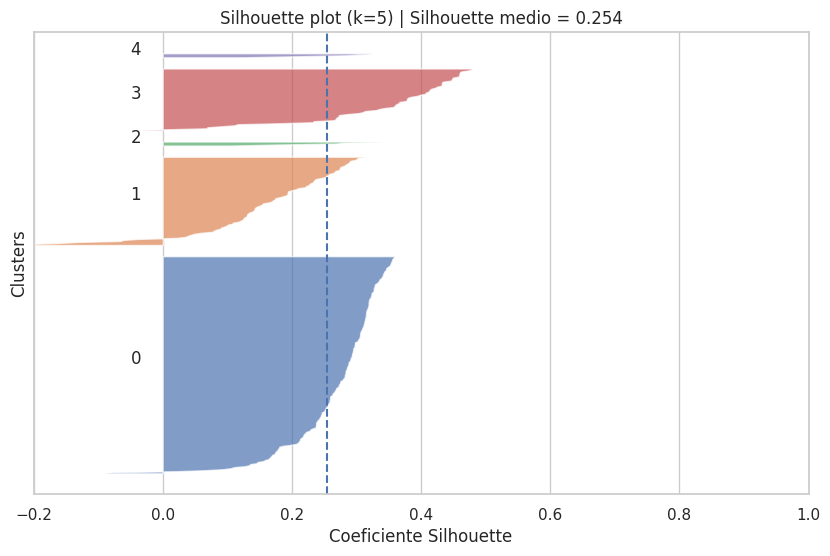

In [132]:
s, df_s, resumen_s, sil_global = silhouette_por_cluster(gower_dist_matrix, labels)
print("Silhouette global:", sil_global)
print(resumen_s)

plot_silhouette('Sht1',gower_dist_matrix, labels)

### PAM + HCA

In [133]:
D = np.asarray(gower_dist_matrix, dtype=float)
labels_hac = df_glower_f["cluster_hac"].values  # 0..k-1

sil_ind = silhouette_samples(D, labels_hac, metric="precomputed")
sil_global = silhouette_score(D, labels_hac, metric="precomputed")

print(f"Silhouette global HCA: {sil_global:.3f}")
df_glower_f["sil_hac"] = sil_ind

threshold = 0.1

problem_idx = np.where(sil_ind < threshold)[0]
stable_idx  = np.where(sil_ind >= threshold)[0]

print(f"Puntos problemáticos: {len(problem_idx)} de {len(df_glower_f)}")

Silhouette global HCA: 0.254
Puntos problemáticos: 30 de 375


In [134]:
clusters_ids = np.unique(labels_hac)
medoid_by_cluster = {}  # dict cluster_id -> índice global del medoid

for c in clusters_ids:
    idx = np.where(labels_hac == c)[0]
    if len(idx) == 0:
        continue
    
    D_sub = D[np.ix_(idx, idx)]
    
    # PAM con k=1 (un solo medoid) sobre la submatriz
    initial_medoids = [0]  # índice relativo en D_sub
    pam = kmedoids(
        D_sub,
        initial_medoids,
        data_type='distance_matrix'
    )
    pam.process()
    medoid_rel = pam.get_medoids()[0]  # índice relativo
    medoid_abs = idx[medoid_rel]       # índice absoluto en df
    
    medoid_by_cluster[c] = medoid_abs

print("Medoids por cluster (índices de df_glower_f):")
print(medoid_by_cluster)

Medoids por cluster (índices de df_glower_f):
{0: 310, 1: 106, 2: 210, 3: 128, 4: 253}


In [135]:
df_glower_f["is_medoid_hac"] = False
df_glower_f.loc[list(medoid_by_cluster.values()), "is_medoid_hac"] = True

cluster_ids_sorted = np.array(sorted(medoid_by_cluster.keys()))
medoids_indices    = np.array([medoid_by_cluster[c] for c in cluster_ids_sorted])

dist_to_medoids = D[np.ix_(problem_idx, medoids_indices)]  # (n_problems x n_clusters)

In [136]:
closest_medoid_col = dist_to_medoids.argmin(axis=1)
new_clusters_for_problem = cluster_ids_sorted[closest_medoid_col]

labels_refined = labels_hac.copy()
labels_refined[problem_idx] = new_clusters_for_problem

In [137]:
df_glower_f["cluster_hac_refined"] = labels_refined

sil_ind_ref = silhouette_samples(D, labels_refined, metric="precomputed")
sil_global_ref = silhouette_score(D, labels_refined, metric="precomputed")

print(f"Silhouette global HCA original : {sil_global:.3f}")
print(f"Silhouette global HCA refinado : {sil_global_ref:.3f}")

df_glower_f["sil_hac_refined"] = sil_ind_ref

changes = labels_refined != labels_hac
print(f"Puntos reasignados: {changes.sum()}")

ct = pd.crosstab(labels_hac, labels_refined, rownames=["HCA"], colnames=["Refinado"])
print(ct)

Silhouette global HCA original : 0.254
Silhouette global HCA refinado : 0.261
Puntos reasignados: 13
Refinado    0   1  2   3  4
HCA                        
0         213   2  0   0  0
1           6  78  1   0  3
2           0   0  5   0  0
3           0   0  1  61  0
4           0   0  0   0  5


Silhouette global: 0.2608986840154948
           n      mean    median       min       max       p25       p75  \
cluster                                                                    
3         61  0.362727  0.392242 -0.044132  0.487579  0.315072  0.444466   
0        219  0.261102  0.281213 -0.081729  0.361095  0.229684  0.312338   
1         80  0.207990  0.228927 -0.174596  0.373602  0.132494  0.277607   
4          8  0.128894  0.127565 -0.074705  0.280907  0.046779  0.225018   
2          7  0.122717  0.147568 -0.024006  0.276533  0.056204  0.173257   

         neg_share  near0_share  
cluster                          
3         0.016393     0.016393  
0         0.009132     0.004566  
1         0.012500     0.062500  
4         0.125000     0.125000  
2         0.142857     0.142857  


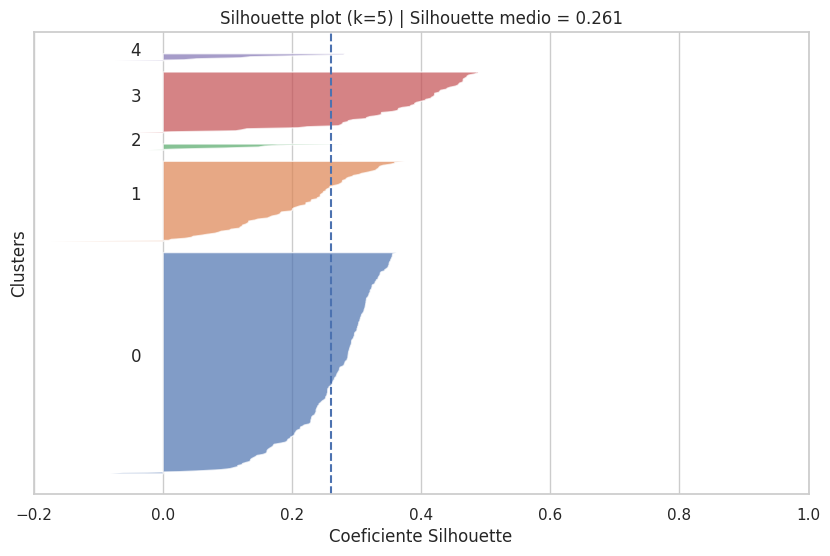

In [138]:
labels_finales = df_glower_f["cluster_hac_refined"].values

s, df_s, resumen_s1, sil_global_1 = silhouette_por_cluster(gower_dist_matrix, labels_finales)
print("Silhouette global:", sil_global_1)
print(resumen_s1)
  
plot_silhouette('silhN2',gower_dist_matrix, labels_finales)

### Experimento 2

In [139]:
#sample_silhouette_values = silhouette_samples(gower_dist_matrix, labels, metric='precomputed')
#df_glower_f['silhouette_score'] = sample_silhouette_values

df_tesis_final = df_glower_f[df_glower_f['sil_hac_refined'] > 0.1].copy()
posiciones_validas = [df_glower_f.index.get_loc(idx) for idx in df_tesis_final.index]

eliminados = len(df_glower_f) - len(df_tesis_final)
print(f"{eliminados} registros con inconsistencia estructural.")

24 registros con inconsistencia estructural.


In [140]:
#indices_limpios = df_tesis_final.index
gower_limpia = gower_dist_matrix[np.ix_(posiciones_validas, posiciones_validas)]
labels_finales = df_tesis_final['cluster_hac_refined'].values

nuevo_silhouette_avg = silhouette_score(gower_limpia, labels_finales, metric='precomputed')

print(f"--- RESULTADO POST-LIMPIEZA (Muestra Refinada) ---")
print(f"Registros restantes: {len(df_tesis_final)}")
print(f"Silhouette Score Global: {nuevo_silhouette_avg:.4f}")

--- RESULTADO POST-LIMPIEZA (Muestra Refinada) ---
Registros restantes: 351
Silhouette Score Global: 0.2743


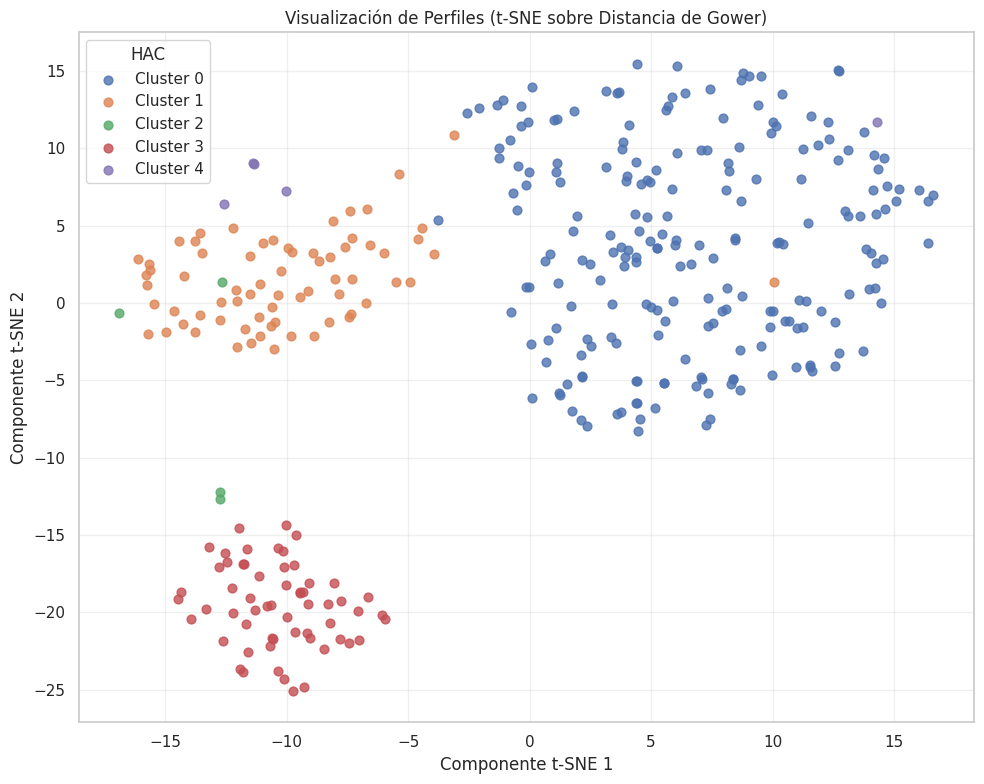

In [141]:
labels_limpios = df_tesis_final['cluster_hac_refined'].values
D = np.asarray(gower_limpia, dtype=float)

tsne = TSNE(
    n_components=2,
    metric="precomputed",
    init="random", 
    perplexity=30,
    learning_rate=200,
    random_state=42
)

X_tsne = tsne.fit_transform(D)   # (n x 2)

clusters = np.unique(labels_limpios)

plt.figure(figsize=(10, 8))
for c in clusters:
    mask = (labels_limpios == c)
    plt.scatter(
        X_tsne[mask, 0],
        X_tsne[mask, 1],
        s=40,
        alpha=0.8,
        label=f"Cluster {c}"  # +1 sólo para mostrar 1..k
    )

plt.title("Visualización de Perfiles (t-SNE sobre Distancia de Gower)")
plt.xlabel("Componente t-SNE 1")
plt.ylabel("Componente t-SNE 2")
plt.legend(title="HAC", loc="best")
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('TSNE2.png', dpi=300, bbox_inches='tight')

plt.show()

### Evaluación HCA

Silhouette global: 0.2742662312507747
           n      mean    median       min       max       p25       p75  \
cluster                                                                    
3         59  0.373131  0.397854  0.061200  0.497129  0.327189  0.455800   
0        214  0.262588  0.280964  0.005532  0.365275  0.231091  0.313359   
2          4  0.258982  0.288915  0.113866  0.344233  0.233589  0.314309   
4          5  0.253954  0.242572  0.158061  0.350375  0.240443  0.278317   
1         69  0.228306  0.236036  0.067440  0.364289  0.151040  0.290479   

         neg_share  near0_share  
cluster                          
3              0.0     0.000000  
0              0.0     0.014019  
2              0.0     0.000000  
4              0.0     0.000000  
1              0.0     0.000000  


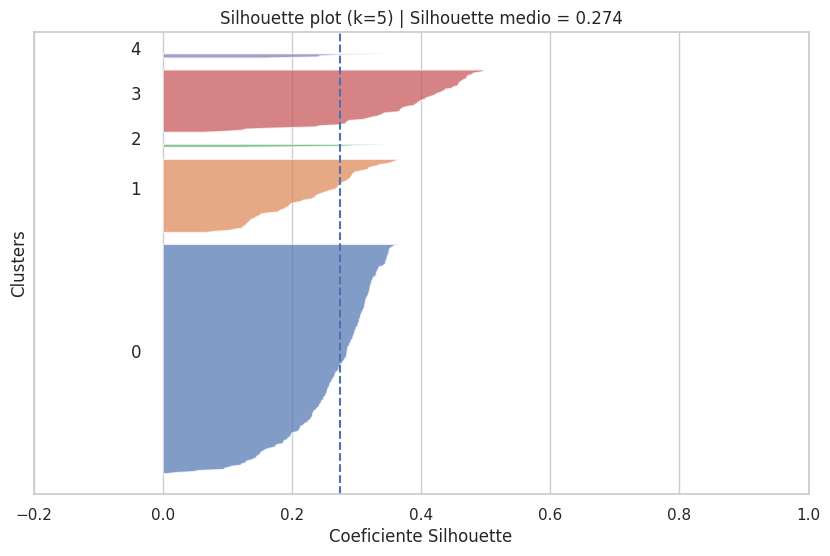

In [142]:
s, df_s, resumen_s, sil_global = silhouette_por_cluster(gower_limpia, labels_limpios)
print("Silhouette global:", sil_global)
print(resumen_s)

plot_silhouette('siln3',gower_limpia, labels_limpios)

### Experimento 3

In [143]:
clusters_validos = [0, 1, 3]

df_final_tesis = df_tesis_final[df_tesis_final['cluster_hac_refined'].isin(clusters_validos)].copy()

n_final = len(df_final_tesis)
perdida = len(df_tesis_final) - n_final

print(f"Distribución: \n{df_final_tesis['cluster_hac_refined'].value_counts(normalize=True) * 100}")

Distribución: 
cluster_hac_refined
0    62.573099
1    20.175439
3    17.251462
Name: proportion, dtype: float64


In [144]:
indices_finales = df_final_tesis.index
D = gower_dist_matrix[np.ix_(indices_finales, indices_finales)]
labels_finales = df_final_tesis['cluster_hac_refined'].values

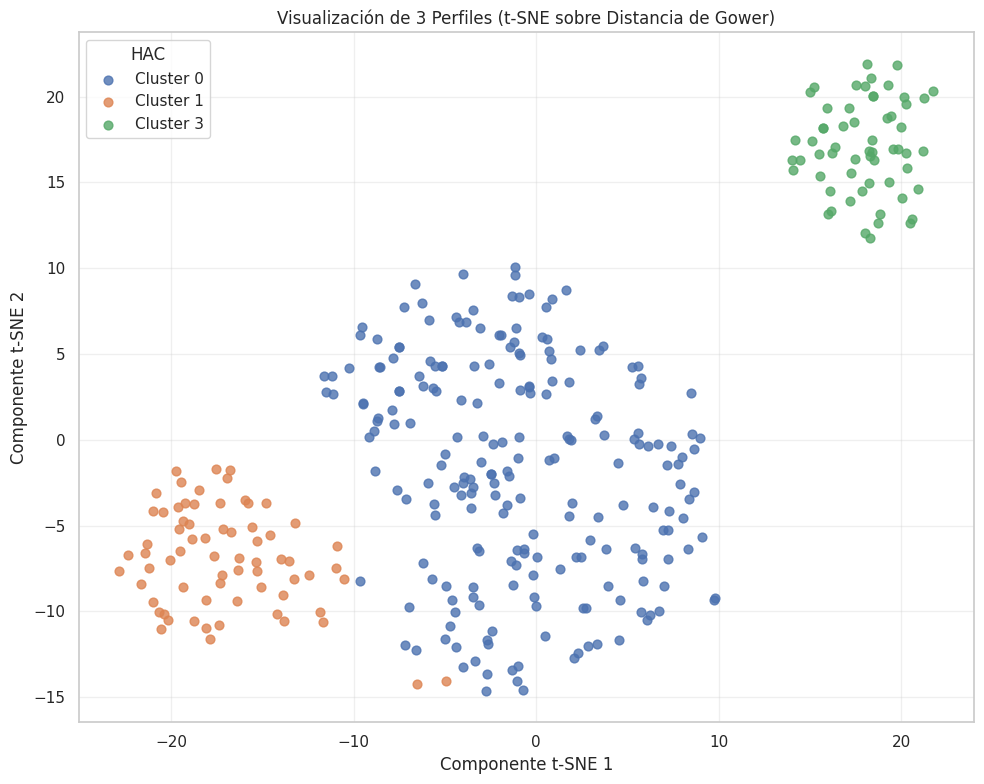

In [145]:
tsne = TSNE(
    n_components=2,
    metric="precomputed",
    init="random", 
    perplexity=30,
    learning_rate=200,
    random_state=42
)

X_tsne = tsne.fit_transform(D)   # (n x 2)

clusters = np.unique(labels_finales)

plt.figure(figsize=(10, 8))
for c in clusters:
    mask = (labels_finales == c)
    plt.scatter(
        X_tsne[mask, 0],
        X_tsne[mask, 1],
        s=40,
        alpha=0.8,
        label=f"Cluster {c}"  # +1 sólo para mostrar 1..k
    )

plt.title("Visualización de 3 Perfiles (t-SNE sobre Distancia de Gower)")
plt.xlabel("Componente t-SNE 1")
plt.ylabel("Componente t-SNE 2")
plt.legend(title="HAC", loc="best")
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('TSNE3.png', dpi=300, bbox_inches='tight')

plt.show()

### Evaluación HCA

Silhouette global: 0.2988575166216587
           n      mean    median       min       max       p25       p75  \
cluster                                                                    
3         59  0.400991  0.406918  0.266523  0.497129  0.353640  0.458011   
0        214  0.277623  0.289599  0.101458  0.365275  0.252033  0.314579   
1         69  0.277383  0.296629  0.110014  0.435787  0.195164  0.352021   

         neg_share  near0_share  
cluster                          
3              0.0          0.0  
0              0.0          0.0  
1              0.0          0.0  


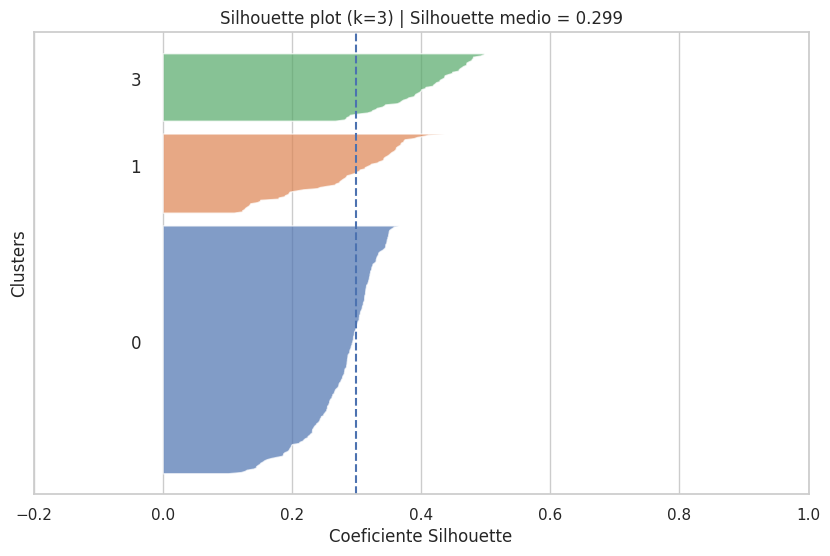

In [146]:
s, df_s, resumen_s, sil_global = silhouette_por_cluster(D, labels_finales)
print("Silhouette global:", sil_global)
print(resumen_s)

plot_silhouette('silh4',D, labels_finales)

### Resumen de variables clave

In [147]:
#assert len(labels) == len(df_glower_f), "labels y df_glower_f no tienen la misma longitud"
#df_glower_f["cluster_hac_refined"] = labels

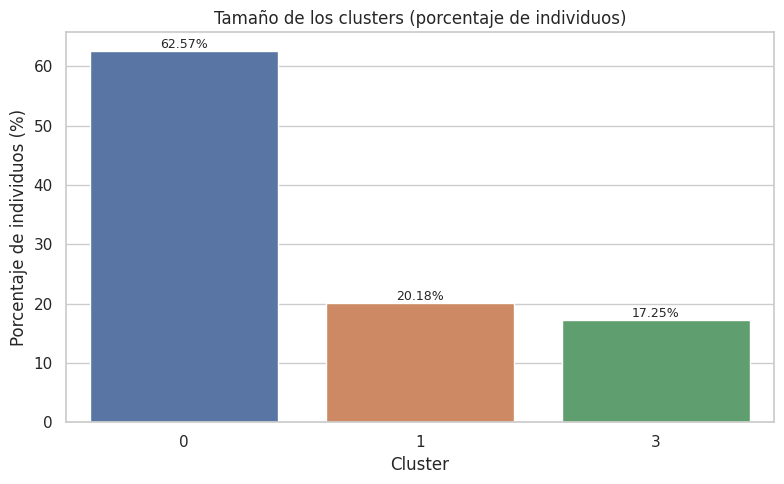

In [148]:
cluster_col = 'cluster_hac_refined'

cluster_counts = (
    df_final_tesis[cluster_col]
    .value_counts()
    .sort_index() 
)
cluster_pct = cluster_counts / cluster_counts.sum() * 100

df_size = pd.DataFrame({
    "cluster": cluster_counts.index,
    "n": cluster_counts.values,
    "pct": cluster_pct.values
})

plt.figure(figsize=(8, 5))
sns.barplot(
    data=df_size,
    x="cluster",
    y="pct"
)

plt.title("Tamaño de los clusters (porcentaje de individuos)")
plt.xlabel("Cluster")
plt.ylabel("Porcentaje de individuos (%)")

for i, row in df_size.iterrows():
    plt.text(
        i,
        row["pct"],                    # pequeño offset vertical
        f"{row['pct']:.2f}%", 
        ha="center",
        va="bottom",
        fontsize=9
    )

plt.tight_layout()

plt.savefig('porcent.png', dpi=300, bbox_inches='tight')

plt.show()

In [149]:
#df_final_tesis.head(15)

In [150]:
num_vars = ['Q5_Edad', 'Q11_NivelInstruccion_ord']
cluster_col = 'cluster_hac_refined'

summary_num = (
    df_final_tesis.groupby(cluster_col)[num_vars]
      .agg(['count', 'mean', 'median', 'std', 'min', 'max'])
)

print(summary_num)

                    Q5_Edad                                          \
                      count       mean median       std   min   max   
cluster_hac_refined                                                   
0                       214  27.238318   26.0  7.861729  17.0  58.0   
1                        69  32.913043   30.0  9.915435  21.0  68.0   
3                        59  22.525424   21.0  4.900232  17.0  42.0   

                    Q11_NivelInstruccion_ord                                  \
                                       count      mean median       std  min   
cluster_hac_refined                                                            
0                                        214  0.018692    0.0  0.135751  0.0   
1                                         69  2.666667    3.0  0.760547  1.0   
3                                         59  0.118644    0.0  0.418731  0.0   

                          
                     max  
cluster_hac_refined       
0          

In [151]:
cat_vars = [
    'Q4_Genero', 
    'Q7_Autoidentificacion',
    'Q8_Idiomas',
    'Q10_TipoColegio',
    'Q12_EstadoCivil',         
    'Q76_Zona',
    'Q82_TenenciaVivienda',
    'Q95_Auto',
    'Q98_Trabaja',
    'Q99_Tiene_Discapacidad',
    'Q100_Carga_Familiar_ord',
    'Q101_IAT_Acceso'
]


def top_cat_stats(group, col):
    vc = group[col].value_counts(normalize=True, dropna=False)
    top_cat = vc.index[0]
    top_pct = vc.iloc[0]
    return pd.Series({'top_cat': top_cat, 'top_pct': top_pct})

res_cat_list = []

for col in cat_vars:
    tmp = (
        df_final_tesis.groupby(cluster_col)
          .apply(lambda g: top_cat_stats(g, col))
          .reset_index()
    )
    tmp['variable'] = col
    res_cat_list.append(tmp)

summary_cat = (
    pd.concat(res_cat_list, ignore_index=True)
      .pivot(index=[cluster_col],
             columns='variable',
             values=['top_cat', 'top_pct'])
)

summary_cat = summary_cat.sort_index(axis=1, level=1)
print(summary_cat)

                                    top_cat                 top_pct  \
variable            Q100_Carga_Familiar_ord Q100_Carga_Familiar_ord   
cluster_hac_refined                                                   
0                                       0.0                0.621495   
1                                       0.0                0.608696   
3                                       0.0                0.779661   

                            top_cat         top_pct         top_cat  \
variable            Q101_IAT_Acceso Q101_IAT_Acceso Q10_TipoColegio   
cluster_hac_refined                                                   
0                               3.0        0.607477             1.0   
1                               3.0        0.942029             1.0   
3                               3.0        0.644068             1.0   

                            top_pct         top_cat         top_pct   top_cat  \
variable            Q10_TipoColegio Q12_EstadoCivil Q12_EstadoCiv

/tmp/ipykernel_48/2160245779.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: top_cat_stats(g, col))
/tmp/ipykernel_48/2160245779.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: top_cat_stats(g, col))
/tmp/ipykernel_48/2160245779.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version 

In [152]:
df_final_tesis.head(10)

,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q11_NivelInstruccion_ord,Q12_EstadoCivil,Q76_Zona,Q82_TenenciaVivienda,Q95_Auto,Q98_Trabaja,Q99_Tiene_Discapacidad,Q100_Carga_Familiar_ord,Q101_IAT_Acceso,cluster_hac,sil_hac,is_medoid_hac,cluster_hac_refined,sil_hac_refined
0,1,24.0,6,2,1,0.0,6,2,4,0,0.0,0.0,0.0,1.0,3,0.330376,False,3,0.331312
1,1,17.0,6,2,2,0.0,6,1,1,1,0.0,0.0,0.0,3.0,3,0.267927,False,3,0.337773
2,1,32.0,6,2,3,0.0,6,1,4,0,1.0,0.0,0.0,3.0,0,0.275428,False,0,0.286707
3,2,22.0,6,2,4,0.0,6,1,1,1,0.0,1.0,0.0,3.0,3,0.362391,False,3,0.406858
4,1,26.0,8,7,2,0.0,6,1,4,1,1.0,0.0,0.0,3.0,0,0.180361,False,0,0.170529
5,1,27.0,6,2,1,0.0,1,1,4,0,1.0,1.0,1.0,3.0,0,0.328507,False,0,0.336128
6,1,21.0,6,2,1,0.0,6,2,5,0,1.0,1.0,0.0,3.0,0,0.321954,False,0,0.322796
7,2,18.0,6,2,1,0.0,6,2,2,0,0.0,0.0,0.0,2.0,3,0.415992,False,3,0.420051
9,2,19.0,6,2,1,0.0,6,1,5,1,0.0,0.0,0.0,3.0,3,0.432178,False,3,0.438272
10,2,21.0,6,2,1,1.0,6,1,4,0,1.0,1.0,0.0,3.0,1,-0.162214,False,0,0.169806


In [153]:
variables_clave = ['Q5_Edad','Q98_Trabaja', 'Q99_Tiene_Discapacidad', 'Q101_IAT_Acceso', 'Q100_Carga_Familiar_ord', 'Q11_NivelInstruccion_ord']

print("--- PRUEBA DE KRUSKAL-WALLIS (ANOVA NO PARAMÉTRICO) ---")
for var in variables_clave:

    grupos = [df_final_tesis[df_final_tesis['cluster_hac_refined'] == c][var] for c in df_final_tesis['cluster_hac_refined'].unique()]
    stat, p_value = stats.kruskal(*grupos)
    
    print(f"\nVariable: {var}")
    print(f"Estadístico H: {stat:.4f}, p-value: {p_value:.4e}")
    
    if p_value < 0.05:
        print("RESULTADO: Significativo. Existen diferencias reales entre clusters.")
        # post-hoc para saber qué grupos difieren entre sí
        posthoc = sp.posthoc_dunn(df_final_tesis, val_col=var, group_col='cluster_hac_refined', p_adjust='bonferroni')
        print("Matriz Post-hoc (p-values ajustados):")
        print(posthoc)
    else:
        print("RESULTADO: No significativo. Los grupos se comportan igual en esta variable.")

--- PRUEBA DE KRUSKAL-WALLIS (ANOVA NO PARAMÉTRICO) ---

Variable: Q5_Edad
Estadístico H: 55.1496, p-value: 1.0578e-12
RESULTADO: Significativo. Existen diferencias reales entre clusters.
Matriz Post-hoc (p-values ajustados):
          0             1             3
0  1.000000  1.001024e-05  1.467877e-05
1  0.000010  1.000000e+00  3.545698e-13
3  0.000015  3.545698e-13  1.000000e+00

Variable: Q98_Trabaja
Estadístico H: 341.0000, p-value: 8.9700e-75
RESULTADO: Significativo. Existen diferencias reales entre clusters.
Matriz Post-hoc (p-values ajustados):
              0             1             3
0  1.000000e+00  1.000000e+00  9.498540e-72
1  1.000000e+00  1.000000e+00  9.247236e-50
3  9.498540e-72  9.247236e-50  1.000000e+00

Variable: Q99_Tiene_Discapacidad
Estadístico H: 6.1826, p-value: 4.5442e-02
RESULTADO: Significativo. Existen diferencias reales entre clusters.
Matriz Post-hoc (p-values ajustados):
          0         1         3
0  1.000000  0.232532  0.104691
1  0.232532  1.

In [154]:
var_instruccion = 'Q11_NivelInstruccion_ord'
grupos = [df_final_tesis[df_final_tesis['cluster_hac_refined'] == c][var_instruccion] for c in df_final_tesis['cluster_hac_refined'].unique()]
stat, p_value = stats.kruskal(*grupos)

print(f"Variable: Instrucción | p-value: {p_value:.4e}")

Variable: Instrucción | p-value: 8.4272e-67


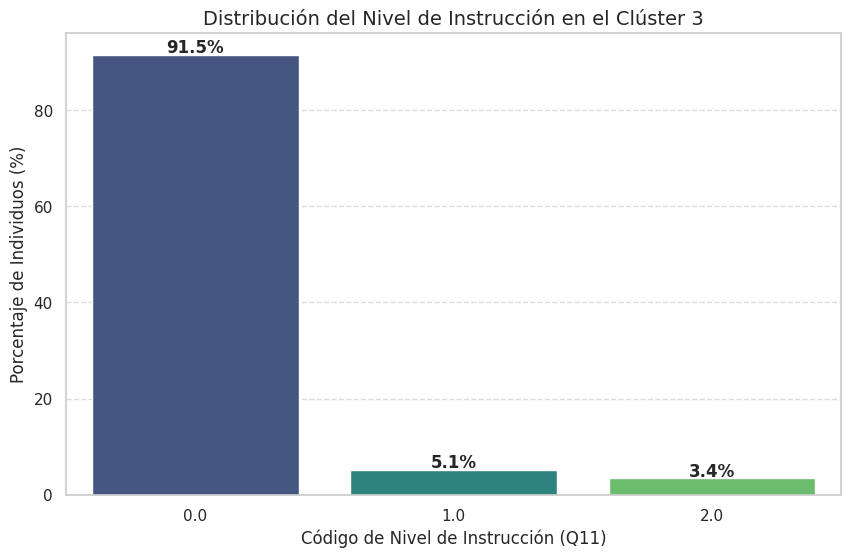

In [155]:
df_c3 = df_final_tesis[df_final_tesis['cluster_hac_refined'] == 3]

edu_dist = df_c3['Q11_NivelInstruccion_ord'].value_counts(normalize=True).sort_index() * 100
plt.figure(figsize=(10, 6))
sns.barplot(x=edu_dist.index, y=edu_dist.values, palette="viridis")
plt.title("Distribución del Nivel de Instrucción en el Clúster 3", fontsize=14)
plt.xlabel("Código de Nivel de Instrucción (Q11)", fontsize=12)
plt.ylabel("Porcentaje de Individuos (%)", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, val in enumerate(edu_dist.values):
    plt.text(i, val + 0.5, f'{val:.1f}%', ha='center', fontweight='bold')

plt.show()

In [156]:
'''
summary_cat_long = (
    summary_cat
    .stack(level=1)               # lleva las variables (Q76_Zona, ...) a filas
    .reset_index()
    .rename(columns={
        'cluster_hac': 'cluster',
        'level_1': 'variable'
    })
)

summary_cat_long['cluster'] = summary_cat_long['cluster'].astype(str)
summary_cat_long['top_cat'] = summary_cat_long['top_cat'].astype(str)
summary_cat_long['top_pct_pct'] = summary_cat_long['top_pct'] * 100  # a porcentaje

var_order = [
    'Q76_Zona',
    'Q7_Autoidentificacion',
    'Q84_Celular',
    'Q89_InternetFijo',
    'Q91_Computadora',
    'Q95_Auto',
    'Q97_TieneHijos',
    'Q98_Trabaja',
    'Q99_Tiene_Discapacidad'
]
summary_cat_long['variable'] = pd.Categorical(
    summary_cat_long['variable'],
    categories=var_order,
    ordered=True
)

sns.set(style="whitegrid")

g = sns.catplot(
    data=summary_cat_long,
    kind="bar",
    x="top_pct_pct",
    y="cluster",
    hue="top_cat",
    col="variable",
    col_wrap=3,          # nº de columnas de facets
    orient="h",
    height=3,
    sharex=True,
    sharey=False
)

g.set_axis_labels("Porcentaje dentro del cluster", "Cluster")
g.set_titles("{col_name}")
#g._legend.set_title("Categoría modal")

for ax in g.axes.flatten():
    for p in ax.patches:
        width = p.get_width()
        if width > 0:
            ax.text(
                width + 2,                  # a la derecha
                p.get_y() + p.get_height()/2,
                f"{width:.1f}%",
                va="center", ha="left", fontsize=8
            )

plt.tight_layout()
plt.savefig('catClust.png', dpi=300, bbox_inches='tight')

plt.show()
'''

'\nsummary_cat_long = (\n    summary_cat\n    .stack(level=1)               # lleva las variables (Q76_Zona, ...) a filas\n    .reset_index()\n    .rename(columns={\n        \'cluster_hac\': \'cluster\',\n        \'level_1\': \'variable\'\n    })\n)\n\nsummary_cat_long[\'cluster\'] = summary_cat_long[\'cluster\'].astype(str)\nsummary_cat_long[\'top_cat\'] = summary_cat_long[\'top_cat\'].astype(str)\nsummary_cat_long[\'top_pct_pct\'] = summary_cat_long[\'top_pct\'] * 100  # a porcentaje\n\nvar_order = [\n    \'Q76_Zona\',\n    \'Q7_Autoidentificacion\',\n    \'Q84_Celular\',\n    \'Q89_InternetFijo\',\n    \'Q91_Computadora\',\n    \'Q95_Auto\',\n    \'Q97_TieneHijos\',\n    \'Q98_Trabaja\',\n    \'Q99_Tiene_Discapacidad\'\n]\nsummary_cat_long[\'variable\'] = pd.Categorical(\n    summary_cat_long[\'variable\'],\n    categories=var_order,\n    ordered=True\n)\n\nsns.set(style="whitegrid")\n\ng = sns.catplot(\n    data=summary_cat_long,\n    kind="bar",\n    x="top_pct_pct",\n    y="clust

In [157]:
'''
def plot_heatmap_cat_var(df, cluster_col, var):
    tab = pd.crosstab(
        df[cluster_col],
        df[var],
        normalize='index'
    )

    plt.figure(figsize=(6, 4))
    sns.heatmap(
        tab,
        annot=True,
        fmt=".2f",
        cmap="Blues",
        vmin=0, vmax=1
    )
    plt.title(f"Distribución de {var} por cluster")
    plt.xlabel(var)
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()

cluster_col = "cluster_hac"

for var in cat_vars:
    plot_heatmap_cat_var(df_glower_f, cluster_col, var)
'''

'\ndef plot_heatmap_cat_var(df, cluster_col, var):\n    tab = pd.crosstab(\n        df[cluster_col],\n        df[var],\n        normalize=\'index\'\n    )\n\n    plt.figure(figsize=(6, 4))\n    sns.heatmap(\n        tab,\n        annot=True,\n        fmt=".2f",\n        cmap="Blues",\n        vmin=0, vmax=1\n    )\n    plt.title(f"Distribución de {var} por cluster")\n    plt.xlabel(var)\n    plt.ylabel("Cluster")\n    plt.tight_layout()\n    plt.show()\n\ncluster_col = "cluster_hac"\n\nfor var in cat_vars:\n    plot_heatmap_cat_var(df_glower_f, cluster_col, var)\n'

In [158]:
'''
def map_macro(cluster):
    if cluster in [0, 1]:
        return "M1_Joven_trabaj_sin_hijos"
    elif cluster in [2, 7]:
        return "M2_Muy_joven_sin_trabajo"
    elif cluster in [3, 6]:
        return "M3_Adulto_hijos_zona2"
    elif cluster in [4]:
        return "M4_Adulto_mayor_activos"
    elif cluster in [8]:
        return "M5_Adulto_mayor_sin_activos"
    elif cluster in [5]:
        return "M6_Nicho_especial"
    else:
        return "M99"

df_glower_f["macro_segment"] = df_glower_f["cluster_final"].map(map_macro)
df_glower_f
'''

'\ndef map_macro(cluster):\n    if cluster in [0, 1]:\n        return "M1_Joven_trabaj_sin_hijos"\n    elif cluster in [2, 7]:\n        return "M2_Muy_joven_sin_trabajo"\n    elif cluster in [3, 6]:\n        return "M3_Adulto_hijos_zona2"\n    elif cluster in [4]:\n        return "M4_Adulto_mayor_activos"\n    elif cluster in [8]:\n        return "M5_Adulto_mayor_sin_activos"\n    elif cluster in [5]:\n        return "M6_Nicho_especial"\n    else:\n        return "M99"\n\ndf_glower_f["macro_segment"] = df_glower_f["cluster_final"].map(map_macro)\ndf_glower_f\n'

--------------------------------------------------------------------------

In [159]:
df_final_tesis.head(10)

,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q11_NivelInstruccion_ord,Q12_EstadoCivil,Q76_Zona,Q82_TenenciaVivienda,Q95_Auto,Q98_Trabaja,Q99_Tiene_Discapacidad,Q100_Carga_Familiar_ord,Q101_IAT_Acceso,cluster_hac,sil_hac,is_medoid_hac,cluster_hac_refined,sil_hac_refined
0,1,24.0,6,2,1,0.0,6,2,4,0,0.0,0.0,0.0,1.0,3,0.330376,False,3,0.331312
1,1,17.0,6,2,2,0.0,6,1,1,1,0.0,0.0,0.0,3.0,3,0.267927,False,3,0.337773
2,1,32.0,6,2,3,0.0,6,1,4,0,1.0,0.0,0.0,3.0,0,0.275428,False,0,0.286707
3,2,22.0,6,2,4,0.0,6,1,1,1,0.0,1.0,0.0,3.0,3,0.362391,False,3,0.406858
4,1,26.0,8,7,2,0.0,6,1,4,1,1.0,0.0,0.0,3.0,0,0.180361,False,0,0.170529
5,1,27.0,6,2,1,0.0,1,1,4,0,1.0,1.0,1.0,3.0,0,0.328507,False,0,0.336128
6,1,21.0,6,2,1,0.0,6,2,5,0,1.0,1.0,0.0,3.0,0,0.321954,False,0,0.322796
7,2,18.0,6,2,1,0.0,6,2,2,0,0.0,0.0,0.0,2.0,3,0.415992,False,3,0.420051
9,2,19.0,6,2,1,0.0,6,1,5,1,0.0,0.0,0.0,3.0,3,0.432178,False,3,0.438272
10,2,21.0,6,2,1,1.0,6,1,4,0,1.0,1.0,0.0,3.0,1,-0.162214,False,0,0.169806


In [160]:
df_final_tesis.info()

<class 'pandas.core.frame.DataFrame'>
Index: 342 entries, 0 to 374
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Q4_Genero                 342 non-null    category
 1   Q5_Edad                   342 non-null    float64 
 2   Q7_Autoidentificacion     342 non-null    category
 3   Q8_Idiomas                342 non-null    category
 4   Q10_TipoColegio           342 non-null    category
 5   Q11_NivelInstruccion_ord  342 non-null    float64 
 6   Q12_EstadoCivil           342 non-null    category
 7   Q76_Zona                  342 non-null    category
 8   Q82_TenenciaVivienda      342 non-null    category
 9   Q95_Auto                  342 non-null    category
 10  Q98_Trabaja               342 non-null    float64 
 11  Q99_Tiene_Discapacidad    342 non-null    float64 
 12  Q100_Carga_Familiar_ord   342 non-null    float64 
 13  Q101_IAT_Acceso           342 non-null    float64 
 14 

# FASE II - Entrenamiento supervisado

In [161]:
col_est = [
    'Q4_Genero',
    'Q5_Edad',
    'Q7_Autoidentificacion',
    'Q8_Idiomas',
    'Q10_TipoColegio',
    #'Q11_NivelInstruccion_ord',
    'Q12_EstadoCivil',
    'Q76_Zona',
    'Q82_TenenciaVivienda',
    'Q95_Auto',
    'Q98_Trabaja',
    'Q99_Tiene_Discapacidad',
    'Q100_Carga_Familiar_ord',
    'Q101_IAT_Acceso'
]

target = 'cluster_hac_refined'
df_glower_f = df_final_tesis.copy()

X = df_glower_f[col_est].copy()
y = df_glower_f[target]
#X = df_glower_f.drop(columns=[target]).select_dtypes(exclude=['object'])

In [162]:
X

,Q4_Genero,Q5_Edad,Q7_Autoidentificacion,Q8_Idiomas,Q10_TipoColegio,Q12_EstadoCivil,Q76_Zona,Q82_TenenciaVivienda,Q95_Auto,Q98_Trabaja,Q99_Tiene_Discapacidad,Q100_Carga_Familiar_ord,Q101_IAT_Acceso
0,1,24.0,6,2,1,6,2,4,0,0.0,0.0,0.0,1.0
1,1,17.0,6,2,2,6,1,1,1,0.0,0.0,0.0,3.0
2,1,32.0,6,2,3,6,1,4,0,1.0,0.0,0.0,3.0
3,2,22.0,6,2,4,6,1,1,1,0.0,1.0,0.0,3.0
4,1,26.0,8,7,2,6,1,4,1,1.0,0.0,0.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
369,2,31.0,6,2,3,6,1,2,1,1.0,1.0,0.0,3.0
371,2,19.0,1,2,1,2,2,3,0,1.0,0.0,1.0,3.0
372,2,27.0,6,2,1,1,2,3,0,1.0,1.0,1.0,3.0
373,1,26.0,8,2,1,6,2,6,0,1.0,1.0,0.0,3.0


In [163]:
profile = ProfileReport(X, title="Profiling Report")
profile #Se evidencia columnas con registros 99 importanes. Este análisis exploratorio va apoyar la decisión de mantenerlas o no....

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 99.80it/s][A


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [164]:
mapping = {0: 0, 1: 1, 3:2}
y_mapped = df_glower_f['cluster_hac_refined'].map(mapping)
feature_names = X.columns.tolist()
joblib.dump(feature_names, 'feature_columns.pkl')
X_train, X_test, y_train, y_test = train_test_split(X, y_mapped, test_size=0.2, random_state=42, stratify=y_mapped)

In [165]:
#SI APLICA BALANCEO
#df_train = pd.concat([X_train, y_train], axis=1)
#target_col = y_train.name if hasattr(y_train, 'name') else 'target'

#if target_col is None: target_col = 'cluster_hac_refined'
#max_size = df_train[target_col].value_counts().max()

#df_resampled = pd.DataFrame()

#for class_index in df_train[target_col].unique():
#    df_class = df_train[df_train[target_col] == class_index]
#    df_class_over = df_class.sample(max_size, replace=True, random_state=42)
#    df_resampled = pd.concat([df_resampled, df_class_over], axis=0)

#X_res = df_resampled.drop(target_col, axis=1)
#y_res = df_resampled[target_col]

#print(f"tras balanceo manual:\n{y_res.value_counts()}")

In [166]:
#smote = SMOTE(random_state=42, k_neighbors=2) # k_neighbors bajo porque se tiene muy pocos datos
#X_res, y_res = smote.fit_resample(X_train, y_train)

pesos = {0: 1.0, 1: 3.5, 2: 1.0}

weights_train = np.array([pesos[label] for label in y_train])

train_data = lgb.Dataset(X_train, label=y_train, weight=weights_train)
test_data = lgb.Dataset(X_test, label=y_test, reference=train_data)


params = {
    'objective': 'multiclass',
    'num_class': len(np.unique(y_mapped)),
    'boosting': 'gbdt',          # GBDT para velocidad en datasets grandes
    #'data_sample_strategy': 'gbdt',   
    'learning_rate': 0.1,
    'feature_fraction': 0.7,          # overfitting                 
    #'bagging_fraction': 0.8,
    #'bagging_freq': 5,
    'min_data_in_leaf': 30,          # EVITA que SE CREee hojas para 1 solo registro    
    'force_row_wise': True,            
    'num_leaves': 7,                 # Controla complejidad
    #'class_weight': pesos, #'balanced',
    'max_depth': -1,
    'n_jobs': -1,                     # Paralelización total
    'device': 'cpu',                 
    'data_random_seed': 42,
    'seed': 42,
    'verbosity': -1
    #'lambda_l1': 1.0,
    #'lambda_l2': 1.0,
}

'''
params = {
    'objective': 'multiclass',
    'num_class': len(np.unique(y_mapped)),
    'boosting': 'gbdt',        
    #'data_sample_strategy': 'gbdt',   
    'learning_rate': 0.05,
    'feature_fraction': 0.7,                        
    #'bagging_fraction': 0.8,
    #'bagging_freq': 5,
    'min_data_in_leaf': 8,           
    'force_row_wise': True,           
    'num_leaves': 15,                 
    #'class_weight': pesos, #'balanced',
    'max_depth': -1,
    'n_jobs': -1,                     
    'device': 'cpu',                  # GPU UTILIZAR DE SER EL CASO
    'data_random_seed': 42,
    'seed': 42,
    'verbosity': -1
    #'lambda_l1': 1.0,
    #'lambda_l2': 1.0,
}
'''

model = lgb.train(
    params,
    train_data,
    num_boost_round=100              # Suficiente para clusters
    #valid_sets=[train_data, test_data],        #valid_sets=[test_data],
    #valid_names=['train', 'valid'],
    #    callbacks=[
    #        lgb.early_stopping(stopping_rounds=20),
    #        lgb.log_evaluation(period=10)
    #    ]
)

y_pred_probs = model.predict(X_test)
y_pred = y_pred_probs.argmax(axis=1)

print("--- REPORT CLASIFICACIÓN FINAL (0=C0, 1=C1, 2=C3) ---")
print(classification_report(y_test, y_pred))

--- REPORT CLASIFICACIÓN FINAL (0=C0, 1=C1, 2=C3) ---
              precision    recall  f1-score   support

           0       0.78      0.72      0.75        43
           1       0.29      0.36      0.32        14
           2       1.00      1.00      1.00        12

    accuracy                           0.70        69
   macro avg       0.69      0.69      0.69        69
weighted avg       0.72      0.70      0.70        69



In [167]:
# HYPERPARAMETROS ANTES DE APLICAR DESCOMENTAR!!!
#from lightgbm import LGBMClassifier
#from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold

#estimator = LGBMClassifier(
#    objective='multiclass',
#    boosting_type='gbdt',
#    n_jobs=-1,
#    force_row_wise=True,
#    random_state=42,
#    importance_type='gain',
#    verbosity=-1
#)

#param_distributions = {
#    'n_estimators': [100, 200, 300],
#    'learning_rate': [0.01, 0.05, 0.1],
#    'num_leaves': [7, 15, 31, 63],
#    'max_depth': [-1, 5, 10, 15],
#    'min_child_samples': [5, 10, 20, 30],
#    'feature_fraction': [0.6, 0.7, 0.8, 1.0],
#    'class_weight': [None, {0: 1.0, 1: 3.5, 2: 1.0}]
#}

#cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

#grid_search = GridSearchCV(
#    estimator=estimator,
#    param_grid=param_grid, 
#    scoring='f1_macro', # F1-Macro es mejor para clases desbalanceadas
#    cv=cv,
#    n_jobs=-1,
#    verbose=1
#)

#random_search = RandomizedSearchCV(
#    estimator=estimator,
#    param_distributions=param_distributions,
#    n_iter=20,  # Ajusta según tiempo disponible
#    scoring='f1_macro',
#    cv=cv,
#    n_jobs=-1,
#    verbose=2,
#    random_state=42
#)

#random_search.fit(X_train, y_train)

#print(f"Mejor F1-Macro: {random_search.best_score_:.4f}")
#print(f"Mejores parámetros: {random_search.best_params_}")

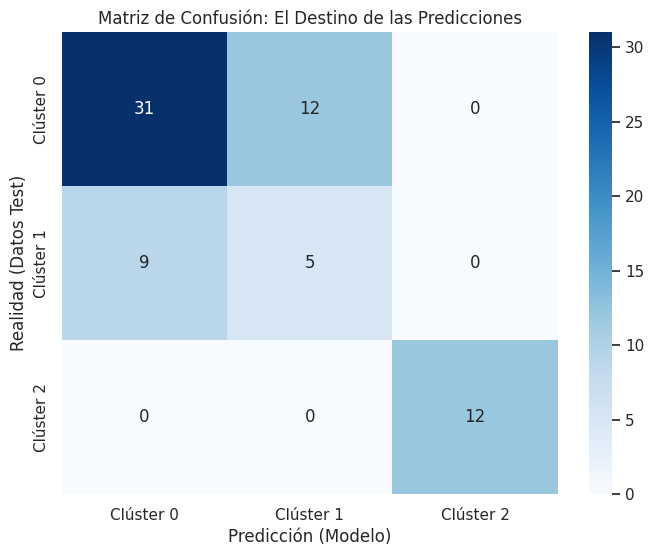

In [168]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
labels = ['Clúster 0', 'Clúster 1', 'Clúster 2']

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=labels, yticklabels=labels)
plt.title('Matriz de Confusión: El Destino de las Predicciones')
plt.xlabel('Predicción (Modelo)')
plt.ylabel('Realidad (Datos Test)')

plt.savefig('matconf.png', dpi=300, bbox_inches='tight')

plt.show()

In [169]:
model.save_model('modelo_final_inec.txt')

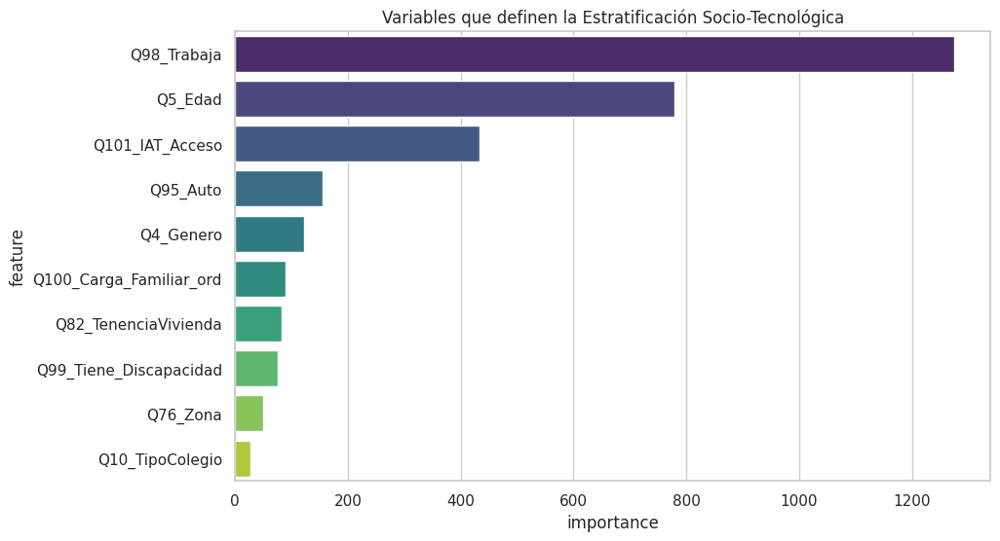

In [170]:
importancia = pd.DataFrame({
    'feature': X.columns,
    'importance': model.feature_importance(importance_type='gain')
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=importancia.head(10), palette='viridis')
plt.title('Variables que definen la Estratificación Socio-Tecnológica')

plt.savefig('valestrat.png', dpi=300, bbox_inches='tight')

plt.show()

### Aplicación de Cross-Validation

In [171]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
resultados = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y_mapped)):
    X_tr, X_val = X.iloc[train_idx], X.iloc[test_idx]
    y_tr, y_val = y_mapped.iloc[train_idx], y_mapped.iloc[test_idx]

    d_fold = lgb.Dataset(X_tr, label=y_tr)
    m_fold = lgb.train(params, d_fold, num_boost_round=100)

    preds_prob = m_fold.predict(X_val)
    preds_class = np.argmax(preds_prob, axis=1)

    acc = accuracy_score(y_val, preds_class)
    kappa = cohen_kappa_score(y_val, preds_class)
    resultados.append((acc, kappa))
    
    print(f"Fold {fold+1} | Accuracy: {acc:.4f} | Kappa: {kappa:.4f}")

Fold 1 | Accuracy: 0.8116 | Kappa: 0.6390
Fold 2 | Accuracy: 0.7681 | Kappa: 0.5505
Fold 3 | Accuracy: 0.8088 | Kappa: 0.6176
Fold 4 | Accuracy: 0.7206 | Kappa: 0.4929
Fold 5 | Accuracy: 0.8235 | Kappa: 0.6516


In [ ]:
mean_acc = np.mean([r[0] for r in resultados])
std_acc = np.std([r[0] for r in resultados])
mean_kappa = np.mean([r[1] for r in resultados])

print("\n" + "="*40)
print(f"RESUMEN DE ESTABILIDAD")
print(f"Accuracy Promedio: {mean_acc:.4f} (±{std_acc:.4f})")
print(f"Kappa de Cohen:    {mean_kappa:.4f}")
print("="*40)

if mean_kappa > 0.70 and std_acc < 0.03:
    print("ESTATUS: El modelo es altamente estable. Procede al INEC con confianza.")
else:
    print("ESTATUS: Inestabilidad detectada. Revisa el balance de tus clusters.")

## Aplicación sobre la Data del INEC

In [ ]:
MODEL_PATH = '/kaggle/working/modelo_final_inec.txt'
FEATURES_PATH = '/kaggle/working/feature_columns.pkl'

INEC_PARQUET = '/kaggle/input/datainec/outputProcessInec.parquet' 
OUTPUT_PARQUET = '/kaggle/working/inec_final_segmentado.parquet'

col_est = [
    'Q4_Genero',
    'Q5_Edad',
    'Q7_Autoidentificacion',
    'Q8_Idiomas',
    'Q10_TipoColegio',
    'Q11_NivelInstruccion_ord',
    'Q12_EstadoCivil',
    'Q76_Zona',
    'Q82_TenenciaVivienda',
    'Q95_Auto',
    'Q98_Trabaja',
    'Q99_Tiene_Discapacidad',
    'Q100_Carga_Familiar_ord',
    'Q101_IAT_Acceso'
]

#IDENTIFICADOR = ['id_per']
#COLUMNS = FEATURES_MODELO + IDENTIFICADOR
#COLUMNS

### Validación estructura INEC

In [ ]:
col_est = joblib.load(FEATURES_PATH)
df_inec_full = pd.read_parquet(INEC_PARQUET)

print(f"Variables esperadas: {len(col_est)}")
missing_cols = [c for c in col_est if c not in df_inec_full.columns]

if not missing_cols:
    print("Todas las variables están presentes en el archivo .parquet.")
    
    comparativa = pd.DataFrame({
        'Variable': col_est,
        'Dtype_Entrenamiento': X[col_est].dtypes.values,
        'Dtype_INEC_Parquet': df_inec_full[col_est].dtypes.values
    })

    comparativa['Match'] = comparativa['Dtype_Entrenamiento'] == comparativa['Dtype_INEC_Parquet']
    print(comparativa)

    print("\n--- DIAGNÓSTICO DE VALORES FALTANTES (INEC) ---")
    nulos = df_inec_full[col_est].isnull().sum()
    print(nulos[nulos > 0])

else:
    print(f" {len(missing_cols)} variables: {missing_cols}")

In [ ]:
cols_to_int = [
    'Q5_Edad', 'Q11_NivelInstruccion_ord', 'Q98_Trabaja', 
    'Q99_Tiene_Discapacidad', 'Q100_Carga_Familiar_ord', 'Q101_IAT_Acceso'
]

cols_to_cat = [
    'Q4_Genero', 'Q7_Autoidentificacion', 'Q8_Idiomas', 
    'Q10_TipoColegio', 'Q12_EstadoCivil', 'Q76_Zona', 
    'Q82_TenenciaVivienda', 'Q95_Auto'
]

for col in cols_to_int:
    df_inec_full[col] = pd.to_numeric(df_inec_full[col], errors='coerce').fillna(0).astype('int64')

for col in cols_to_cat:
    df_inec_full[col] = df_inec_full[col].astype('category')

print(df_inec_full.dtypes)

In [ ]:
X_final = df_inec_full[col_est]
print(all(X_final.columns == feature_names))
X_final

### Predicción sobre INEC

In [ ]:
print("Cargar modelo preentrenado...")
model = lgb.Booster(model_file=MODEL_PATH)

print("Ejecutando clasificación masiva...")
y_pred_probs_final = model.predict(X_final)

df_inec_full['Prob_C0'] = y_pred_probs_final[:, 0]
df_inec_full['Prob_C1'] = y_pred_probs_final[:, 1]
df_inec_full['Prob_C3'] = y_pred_probs_final[:, 2]

df_inec_full['CPRED'] = y_pred_probs_final.argmax(axis=1)

In [ ]:
segmento_map = {0: 'C0', 1: 'C1', 2: 'C3'}
df_inec_full['CPRED_NAME'] = df_inec_full['CPRED'].map(segmento_map)

df_inec_full['CPRED_Conf'] = y_pred_probs_final.max(axis=1)

df_inec_full.to_parquet(OUTPUT_PARQUET, index=False)
print(f"Éxito. Archivo segmentado guardado en: {OUTPUT_PARQUET}")

In [ ]:
df_inec_full

In [ ]:
print(df_inec_full[['p00','CPRED_NAME', 'Prob_C0', 'Prob_C1', 'Prob_C3', 'CPRED_Conf']].head())

In [ ]:
pivot_df = df_inec_full.groupby(['Q101_IAT_Acceso', 'CPRED_NAME']).size().unstack()
pivot_df_pct = pivot_df.div(pivot_df.sum(axis=1), axis=0) * 100

pivot_df_pct.plot(kind='barh', stacked=True, colormap='viridis', figsize=(10, 6))
plt.title('Distribución de Segmentos IAT por Zona (Urbano/Rural)', fontsize=14)
plt.xlabel('Porcentaje (%)')
plt.ylabel('Zona Geográfica')
plt.legend(title='Segmento', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## Ubicación Territorial

In [ ]:
df_inec_full['Canton_ID'] = (
    df_inec_full['i01'].astype(str).str.zfill(2) + 
    df_inec_full['i02'].astype(str).str.zfill(2)
)

In [ ]:
UMBRAL_CORTE = 0.65
df_inec_full['IDP'] = df_inec_full['CPRED_Conf'] >= UMBRAL_CORTE

In [ ]:
# Score de Match por Cantón (Variable i02)
# Cantidad de personas Prototípicas del segmento X en el cantón) / (Población total del cantón)
# Esto nos da la densidad de perfiles ideales por canton.
stats_canton = df_inec_full[df_inec_full['IDP']].groupby(['Canton_ID', 'CPRED_NAME']).size().unstack(fill_value=0)
stats_canton = stats_canton.reindex(columns=['C0', 'C1', 'C3'], fill_value=0)
total_canton = df_inec_full.groupby('Canton_ID').size()
total_canton

In [ ]:
stats_canton

In [ ]:
similitud_canton = stats_canton.div(total_canton, axis=0).fillna(0).reset_index()
similitud_canton['Similitud_Score'] = similitud_canton['C3']

In [ ]:
df_inec_full.head(20)

In [ ]:
print(similitud_canton[['Canton_ID', 'Similitud_Score']].head(20))

0.067 se traduce a que el 6.7% de la población en ese cantón cumple con el perfil ideal C3 bajo el umbral de confianza.

In [ ]:
# normalización min-max para el Similitud_Score
min_score = similitud_canton['Similitud_Score'].min()
max_score = similitud_canton['Similitud_Score'].max()

similitud_canton['Score_Normalizado'] = (
    (similitud_canton['Similitud_Score'] - min_score) / (max_score - min_score)
)

print(similitud_canton[['Canton_ID', 'Similitud_Score', 'Score_Normalizado']].head())

In [ ]:
gdf = gpd.read_file("/kaggle/input/shapes/ORGANIZACION TERRITORIAL DEL ESTADO CANTONAL.shp") 
gdf['DPA_CANTON'] = gdf['DPA_CANTON'].astype(str).str.zfill(4)
similitud_canton['Canton_ID'] = similitud_canton['Canton_ID'].astype(str).str.zfill(4)

In [ ]:
gdf_final = gdf.merge(similitud_canton, left_on='DPA_CANTON', right_on='Canton_ID', how='left')
gdf_final

In [ ]:
ranking_c3 = similitud_canton.merge(
    gdf_final[['Canton_ID', 'DPA_DESCAN']], 
    on='Canton_ID', 
    how='left'
).drop_duplicates('Canton_ID')

top_10_c3 = ranking_c3.sort_values(by='C3', ascending=False).head(10)

print("TOP 10 CANTONES CON MAYOR DENSIDAD DE PERFIL C3")
print(top_10_c3[['Canton_ID', 'DPA_DESCAN', 'C3', 'Score_Normalizado']])

In [ ]:
gdf_final['Score_Normalizado'] = gdf_final['Score_Normalizado'].fillna(0)

In [ ]:
m = folium.Map(location=[-1.8312, -78.1834], zoom_start=7, tiles='cartodbpositron') # centro de Ecuador

In [ ]:
choropleth = Choropleth(
    geo_data=gdf_final,
    data=gdf_final,
    columns=['DPA_CANTON', 'Score_Normalizado'],
    key_on='feature.properties.DPA_CANTON',
    fill_color='GnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Densidad de Perfiles Prototípicos C3 (Clase Alta/IAT)',
    highlight=True
).add_to(m)

In [ ]:
#gdf_final['geometry'] = gdf_final['geometry'].simplify(0.005, preserve_topology=True)
folium.GeoJson(
    gdf_final,
    style_function=lambda x: {'fillColor': 'transparent', 'color': 'transparent'},
    tooltip=folium.GeoJsonTooltip(fields=['DPA_DESCAN', 'C3'], aliases=['Cantón:', 'Score Real C3:'])
).add_to(m)

In [ ]:
#m.save('mapa_final_inec.html')
print("Mapa base creado")
print(f"Capas actuales: {len(m._children)}")

.....

## Isocrona  (Polígonos de accesibilidad)

In [ ]:
api_key = '....'

In [ ]:
icon_ups = folium.CustomIcon(
    icon_image='https://moria.aurens.com/organizations/f3601528-ce6f-450a-9fef-46977b5b575c/logos/1pll5v-IMG_2535.png',  # logo UPS
    icon_size=(40, 40),        
    icon_anchor=(20, 40),     
    popup_anchor=(0, -40)    
)

In [ ]:
def addisocrona(mapa, lat, lon, minutos=[10, 30, 60], nombre_punto="Punto"):
    colores = {10: '#c32148', 30: '#cc5500', 60: '#f1c40f'}
    isocronas_agregadas = 0
    
    for t in minutos:
        
        try:
            url = "https://api.openrouteservice.org/v2/isochrones/driving-car"
            body = {
                "locations": [[lon, lat]], 
                "range": [t * 60], 
                "attributes": ["area", "reachfactor"]
            }
            headers = {
                'Authorization': api_key, 
                'Content-Type': 'application/json', 
                'Accept': 'application/geo+json'
            }
            response = requests.post(url, json=body, headers=headers, timeout=15)
            
            if response.status_code == 429: #esoera para limiting
                time.sleep(10)
                response = requests.post(url, json=body, headers=headers, timeout=15)
            
            if response.status_code != 200:
                print(f"error {response.status_code}: {response.text[:200]}")
                continue
            
            iso_data = response.json()           
            if 'features' not in iso_data or not iso_data['features']:
                print("sin features")
                continue
            
            color = colores.get(t, '#9966cc')
            nombre_capa = f"{nombre_punto}_{t}min"  # sin espacios ni guiones
            geojson_layer = folium.GeoJson(
                iso_data,
                style_function=lambda x, c=color: {
                    'fillColor': c,
                    'color': c,
                    'weight': 2,
                    'fillOpacity': 0.3,
                    'opacity': 0.7
                },
                name=nombre_capa,
                overlay=True,
                control=True,
                show=True
            )            
            geojson_layer.add_to(mapa) #layer de navegación y filtrado
            isocronas_agregadas += 1
            print(f"isócrona {t}min AGREGADA (nombre: {nombre_capa})")
            time.sleep(2)  # pausa entre isocronas
            
        except requests.exceptions.Timeout:
            print(f"TIMEOUT en {t}min")
        except requests.exceptions.RequestException as e:
            print(f"Error request: {str(e)[:100]}")
        except Exception as e:
            print(f"Error: {str(e)[:100]}")
            traceback.print_exc()
    
    return isocronas_agregadas

# ----------------------
# PRINCIPAL CON DEBUGGING
puntos_estrategicos = [
    {"name": "TAISHA", "lat": -2.3833, "lon": -77.5000},
    {"name": "LOGROÑO", "lat": -2.6300, "lon": -78.1691},
    {"name": "ARAJUNO", "lat": -1.2333, "lon": -77.6833},
    {"name": "24 DE MAYO", "lat": -1.2758, "lon": -80.3808},
    {"name": "HUAMBOYA", "lat": -2.0000, "lon": -77.9333},
    {"name": "COLIMES", "lat": -1.5456, "lon": -80.0100},
    {"name": "SOZORANGA", "lat": -4.3297, "lon": -79.7892},
    {"name": "TIWINTZA", "lat": -3.0116, "lon": -77.7288},
    {"name": "ESPINDOLA", "lat": -4.5886, "lon": -79.4217},
    {"name": "MUISNE", "lat": 0.6101, "lon": -80.0194}
]
#print("tipo: {type(m)}")
#print("capas: {len(m._children)}")

for i, p in enumerate(puntos_estrategicos, start=1):
    print(f"  {i:2d}. {p['name']:15s} → ({p['lat']:8.4f}, {p['lon']:9.4f})")

print("\n" + "="*80)
respuesta = input("Continuar ")
if respuesta.lower() == 'n':
    exit()

exitosos = 0
fallidos = 0
total_isocronas = 0

for idx, punto in enumerate(puntos_estrategicos, start=1):
    #print(f"Coordenadas: Lat={punto['lat']}, Lon={punto['lon']}")
    
    try:
        marker = folium.Marker(
            location=[punto['lat'], punto['lon']],
            popup=folium.Popup(
                f"<h4>{punto['name']}</h4>"
                f"<b>Ranking:</b> #{idx}<br>"
                f"<b>Coords:</b> {punto['lat']:.4f}, {punto['lon']:.4f}",
                max_width=250
            ),
            icon=icon_ups,
            tooltip=f"{punto['name']} (#{idx})"
        )
        marker.add_to(m)
        
        #agregación de isocronas
        num_isocronas = addisocrona(
            m, 
            punto['lat'], 
            punto['lon'], 
            minutos=[10, 30, 60],
            nombre_punto=punto['name']
        )
        
        total_isocronas += num_isocronas
        
        if num_isocronas > 0:
            exitosos += 1
            print(f"\n{punto['name']} COMPLETADO ({num_isocronas} isocronas)")
        else:
            fallidos += 1
            print(f"\n {punto['name']} sin isocronas")
        if idx < len(puntos_estrategicos):
            print(f"\nPausa de 5 segundos antes del siguiente punto...")
            time.sleep(5)
        
    except KeyboardInterrupt:
        print("\n\n pausa")
        break
        
    except Exception as e:
        fallidos += 1
        print(f"\nERROR{punto['name']}:")
        print(f"   Tipo: {type(e).__name__}")
        print(f"   Mensaje: {str(e)[:200]}")
        traceback.print_exc()
        respuesta = input("\n siguiente punto ")
        if respuesta.lower() != 's':
            break

print("\n" + "="*80)
print("ok...")

try:
    if not any(isinstance(child, folium.LayerControl) for child in m._children.values()):
        folium.LayerControl(collapsed=False, position='topright').add_to(m)
        print("LayerControl agregado")
except Exception as e:
    print(f"Error LayerControl: {e}")

try:
    m.save('mapa_isocronas_debug.html')
except Exception as e:
    print(f"Error al guardar: {e}")

print("\n" + "="*80)
print("RESUMEN")
print("="*80)
print(f"puntos exitosos:    {exitosos}/{len(puntos_estrategicos)}")
print(f"puntos fallidos:    {fallidos}/{len(puntos_estrategicos)}")
print(f"isocronas creadas:  {total_isocronas} (esperadas: {exitosos * 3})")
print(f"capas en el mapa:   {len(m._children)}")
print(f"marcadores:         {exitosos}")
print("="*80)

print("Capas en el mapa:")
for name, child in list(m._children.items())[:20]:  # primeras 20
    print(f"  - {name[:50]}: {type(child).__name__}")

print("TOOODOO ok")

In [ ]:
#reset del mapa:
#m = folium.Map(
#    location=[-1.83, -78.18], 
#    zoom_start=7, 
#    tiles='cartodbpositron'
#)